# Exercise 6.6.1

In [ ]:
##part A

import numpy as np
import random
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

####################### Parabolic clusters ###########################
##################### Synthetic Data Creation #########################
nSuccess = 0
for zd in range(50):
  nData = 2000 # number of points in each cluster
  nTrain = 1000
  nEpoch = 4 # number of training points
  nTest = 2000 # number of test points
  alpha = 0.01 # step size (learning rate)
  std = 0.5 # standard deviation of the distance of points
  x = np.zeros((2 * nData, 2)) # pre-allocate for the input and the
  t = np.zeros((2 * nData)) # target vector.
  r = np.random.normal(0, std, 2 * nData)
  the = 2 * np.pi * np.random.rand(2 * nData)
  w11f = np.zeros(nEpoch * nTrain)
  w12f = np.zeros(nEpoch * nTrain)
  h = -6 + 12 * np.random.rand(nData)
  v = 5 + (h ** 2) / 6
  x[0:nData, 0] = h + r[0:nData] * np.cos(the[0:nData])
  x[0:nData, 1] = v + r[0:nData] * np.sin(the[0:nData])
  t[0:nData] = 0
  h = -5 + 10 * np.random.rand(nData)
  v = 10 + (h ** 2) / 4
  x[nData:2 * nData, 0] = h + r[nData:2 * nData] * np.cos(the[nData:2 * nData])
  x[nData:2 * nData, 1] = v + r[nData:2 * nData] * np.sin(the[nData:2 * nData])
  t[nData:2 * nData] = 1

  ####################### Normalization ################################
  x[:, 0] = 1 + 0.1 * x[:, 0]
  x[:, 1] = 1 + 0.1 * x[:, 1]

  #################### Parameter Initialization #########################
  w11 = 0.5 - np.random.rand()
  w12 = 0.5 - np.random.rand()
  w21 = 0.5 - np.random.rand()
  w22 = 0.5 - np.random.rand()
  b2 = 0.5 - np.random.rand()
  b1 = 0.5 - np.random.rand()
  ww1 = 0.5 - np.random.rand()
  ww2 = 0.5 - np.random.rand()
  bb = 0.5 - np.random.rand()

  a = range(0, 2 * nData)
  sp = random.sample(a, nTrain + nTest) # indexes for random selection of data for training and testing

  ########################### Training #################################
  p = 0
  for epoch in range(0, nEpoch):
      for i in range(0, nTrain):
          y1 = b1 + w11 * x[sp[i], 0] + w12 * x[sp[i], 1]
          y2 = b2 + w21 * x[sp[i], 0] + w22 * x[sp[i], 1]
          dxx1 = y1 > 0
          xx1 = y1 * dxx1
          dxx2 = y2 > 0
          xx2 = y2 * dxx2 # rect. activation
          yy = bb + ww1 * xx1 + ww2 * xx2
          yy = yy > 0
          e = t[sp[i]] - yy
          ww1 = ww1 + alpha * e * xx1
          ww2 = ww2 + alpha * e * xx2
          bb = bb + alpha * e
          w11 = w11 + alpha * e * ww1 * dxx1 * x[sp[i], 0]
          w12 = w12 + alpha * e * ww1 * dxx1 * x[sp[i], 1]
          w21 = w21 + alpha * e * ww2 * dxx2 * x[sp[i], 0]
          w22 = w22 + alpha * e * ww2 * dxx2 * x[sp[i], 1]
          b1 = b1 + alpha * e * ww1 * dxx1
          b2 = b2 + alpha * e * ww2 * dxx2
          w11f[p] = w11
          w12f[p] = w12
          p = p + 1

  ######################## Testing ######################################
  err = 0
  for i in range(nTrain, nTrain + nTest):
      y1 = b1 + w11 * x[sp[i], 0] + w12 * x[sp[i], 1]
      y2 = b2 + w21 * x[sp[i], 0] + w22 * x[sp[i], 1]
      dxx1 = y1 > 0
      xx1 = y1 * dxx1
      dxx2 = y2 > 0
      xx2 = y2 * dxx2 # rect. activation
      yy = bb + ww1 * xx1 + ww2 * xx2
      yy = yy > 0
      e = abs(t[sp[i]] - yy)
      err = err + e
  err = err / nTest
  print(err)
  if err < 0.05:
    nSuccess += 1

  # ######################## Plotting Part ##############################
  # if err < 0.07:
  #     plt.figure(figsize=(10, 10))
  #     plt.scatter(x[0:nData, 0], x[0:nData, 1])
  #     plt.scatter(x[nData:2 * nData, 0], x[nData:2 * nData, 1])

  #     X = np.arange(0.25, 1.75, 0.02)
  #     Y = np.arange(1.25, 2.75, 0.02)
  #     X, Y = np.meshgrid(X, Y)
  #     y1 = b1 + w11 * X + w12 * Y
  #     y2 = b2 + w21 * X + w22 * Y
  #     dxx1 = y1 > 0
  #     xx1 = y1 * dxx1
  #     dxx2 = y2 > 0
  #     xx2 = y2 * dxx2 # rect. activation
  #     yy = bb + ww1 * xx1 + ww2 * xx2
  #     Z = yy > 0
  #     plt.scatter(X, Y, c=Z+1, alpha=0.3)

  #     plt.figure(figsize=(10, 10))
  #     f = np.arange(0, nEpoch * nTrain, 1)
  #     plt.plot(f, w11f)

  #     plt.figure(figsize=(10, 10))
  #     plt.plot(f, w12f)

  #     plt.figure(figsize=(10, 10))
  #     ax = plt.axes(projection='3d')
  #     ax.scatter(x[0:nData, 0], x[0:nData, 1], 0, cmap='viridis', s=30)
  #     ax.scatter(x[nData:2 * nData, 0], x[nData:2 * nData, 1], 1, cmap='viridis', s=30)

  #     X = np.arange(0.25, 1.75, 0.02) # Shorter X-range for visibility
  #     Y = np.arange(1.25, 2.75, 0.02)
  #     X, Y = np.meshgrid(X, Y)
  #     y1 = b1 + w11 * X + w12 * Y
  #     y2 = b2 + w21 * X + w22 * Y
  #     dxx1 = y1 > 0
  #     xx1 = y1 * dxx1
  #     dxx2 = y2 > 0
  #     xx2 = y2 * dxx2 # rect. activation
  #     yy = bb + ww1 * xx1 + ww2 * xx2
  #     Z = yy > 0
  #     ax.plot_surface(X, Y, Z, rstride=1, cstride=1, cmap='viridis', alpha=0.5)


print(nSuccess)

0.1235
0.002
0.0915
0.1785
0.088
0.112
0.512
0.0995
0.1225
0.366
0.235
0.1935
0.2865
0.5015
0.497
0.011
0.1185
0.4465
0.0815
0.156
0.0985
0.4995
0.1445
0.507
0.113
0.071
0.499
0.2695
0.091
0.3545
0.0985
0.4865
0.099
0.4965
0.073
0.4345
0.0115
0.491
0.0835
0.1105
0.297
0.5035
0.072
0.5025
0.1275
0.2135
0.163
0.491
0.5055
0.077
3


In [ ]:
##part B

import numpy as np
import random
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from tabulate import tabulate

####################### Parabolic clusters ###########################
##################### Synthetic Data Creation #########################
for nEpoch in range (1,7):
  alpha = 0
  for alpha_count in range(14):
    nSuccess = 0
    if alpha >= 0.01:
      alpha += 0.01
    else:
      alpha += 0.001
    alpha = round(alpha, 3)
    for zd in range(50):
      nData = 2000 # number of points in each cluster
      nTrain = 1000
      nTest = 2000 # number of test points
      std = 0.5 # standard deviation of the distance of points
      x = np.zeros((2 * nData, 2)) # pre-allocate for the input and the
      t = np.zeros((2 * nData)) # target vector.
      r = np.random.normal(0, std, 2 * nData)
      the = 2 * np.pi * np.random.rand(2 * nData)
      w11f = np.zeros(nEpoch * nTrain)
      w12f = np.zeros(nEpoch * nTrain)
      h = -6 + 12 * np.random.rand(nData)
      v = 5 + (h ** 2) / 6
      x[0:nData, 0] = h + r[0:nData] * np.cos(the[0:nData])
      x[0:nData, 1] = v + r[0:nData] * np.sin(the[0:nData])
      t[0:nData] = 0
      h = -5 + 10 * np.random.rand(nData)
      v = 10 + (h ** 2) / 4
      x[nData:2 * nData, 0] = h + r[nData:2 * nData] * np.cos(the[nData:2 * nData])
      x[nData:2 * nData, 1] = v + r[nData:2 * nData] * np.sin(the[nData:2 * nData])
      t[nData:2 * nData] = 1

      ####################### Normalization ################################
      x[:, 0] = 1 + 0.1 * x[:, 0]
      x[:, 1] = 1 + 0.1 * x[:, 1]

      #################### Parameter Initialization #########################
      w11 = 0.5 - np.random.rand()
      w12 = 0.5 - np.random.rand()
      w21 = 0.5 - np.random.rand()
      w22 = 0.5 - np.random.rand()
      b2 = 0.5 - np.random.rand()
      b1 = 0.5 - np.random.rand()
      ww1 = 0.5 - np.random.rand()
      ww2 = 0.5 - np.random.rand()
      bb = 0.5 - np.random.rand()

      a = range(0, 2 * nData)
      sp = random.sample(a, nTrain + nTest) # indexes for random selection of data for training and testing

      ########################### Training #################################
      p = 0
      for epoch in range(0, nEpoch):
          for i in range(0, nTrain):
              y1 = b1 + w11 * x[sp[i], 0] + w12 * x[sp[i], 1]
              y2 = b2 + w21 * x[sp[i], 0] + w22 * x[sp[i], 1]
              dxx1 = y1 > 0
              xx1 = y1 * dxx1
              dxx2 = y2 > 0
              xx2 = y2 * dxx2 # rect. activation
              yy = bb + ww1 * xx1 + ww2 * xx2
              yy = yy > 0
              e = t[sp[i]] - yy
              ww1 = ww1 + alpha * e * xx1
              ww2 = ww2 + alpha * e * xx2
              bb = bb + alpha * e
              w11 = w11 + alpha * e * ww1 * dxx1 * x[sp[i], 0]
              w12 = w12 + alpha * e * ww1 * dxx1 * x[sp[i], 1]
              w21 = w21 + alpha * e * ww2 * dxx2 * x[sp[i], 0]
              w22 = w22 + alpha * e * ww2 * dxx2 * x[sp[i], 1]
              b1 = b1 + alpha * e * ww1 * dxx1
              b2 = b2 + alpha * e * ww2 * dxx2
              w11f[p] = w11
              w12f[p] = w12
              p = p + 1

      ######################## Testing ######################################
      err = 0
      for i in range(nTrain, nTrain + nTest):
          y1 = b1 + w11 * x[sp[i], 0] + w12 * x[sp[i], 1]
          y2 = b2 + w21 * x[sp[i], 0] + w22 * x[sp[i], 1]
          dxx1 = y1 > 0
          xx1 = y1 * dxx1
          dxx2 = y2 > 0
          xx2 = y2 * dxx2 # rect. activation
          yy = bb + ww1 * xx1 + ww2 * xx2
          yy = yy > 0
          e = abs(t[sp[i]] - yy)
          err = err + e
      err = err / nTest
      if err < 0.05:
        nSuccess += 1

      # ######################## Plotting Part ##############################
      # if err < 0.07:
      #     plt.figure(figsize=(10, 10))
      #     plt.scatter(x[0:nData, 0], x[0:nData, 1])
      #     plt.scatter(x[nData:2 * nData, 0], x[nData:2 * nData, 1])

      #     X = np.arange(0.25, 1.75, 0.02)
      #     Y = np.arange(1.25, 2.75, 0.02)
      #     X, Y = np.meshgrid(X, Y)
      #     y1 = b1 + w11 * X + w12 * Y
      #     y2 = b2 + w21 * X + w22 * Y
      #     dxx1 = y1 > 0
      #     xx1 = y1 * dxx1
      #     dxx2 = y2 > 0
      #     xx2 = y2 * dxx2 # rect. activation
      #     yy = bb + ww1 * xx1 + ww2 * xx2
      #     Z = yy > 0
      #     plt.scatter(X, Y, c=Z+1, alpha=0.3)

      #     plt.figure(figsize=(10, 10))
      #     f = np.arange(0, nEpoch * nTrain, 1)
      #     plt.plot(f, w11f)

      #     plt.figure(figsize=(10, 10))
      #     plt.plot(f, w12f)

      #     plt.figure(figsize=(10, 10))
      #     ax = plt.axes(projection='3d')
      #     ax.scatter(x[0:nData, 0], x[0:nData, 1], 0, cmap='viridis', s=30)
      #     ax.scatter(x[nData:2 * nData, 0], x[nData:2 * nData, 1], 1, cmap='viridis', s=30)

      #     X = np.arange(0.25, 1.75, 0.02) # Shorter X-range for visibility
      #     Y = np.arange(1.25, 2.75, 0.02)
      #     X, Y = np.meshgrid(X, Y)
      #     y1 = b1 + w11 * X + w12 * Y
      #     y2 = b2 + w21 * X + w22 * Y
      #     dxx1 = y1 > 0
      #     xx1 = y1 * dxx1
      #     dxx2 = y2 > 0
      #     xx2 = y2 * dxx2 # rect. activation
      #     yy = bb + ww1 * xx1 + ww2 * xx2
      #     Z = yy > 0
      #     ax.plot_surface(X, Y, Z, rstride=1, cstride=1, cmap='viridis', alpha=0.5)
    print(alpha, nEpoch, nSuccess)

0.001 1 0
0.002 1 0
0.003 1 1
0.004 1 1
0.005 1 0
0.006 1 1
0.007 1 0
0.008 1 1
0.009 1 0
0.01 1 1
0.02 1 0
0.03 1 0
0.04 1 1
0.05 1 0
0.001 2 1
0.002 2 1
0.003 2 0
0.004 2 1
0.005 2 0
0.006 2 0
0.007 2 0
0.008 2 3
0.009 2 4
0.01 2 5
0.02 2 2
0.03 2 3
0.04 2 0
0.05 2 0
0.001 3 0
0.002 3 1
0.003 3 1
0.004 3 2
0.005 3 1
0.006 3 3
0.007 3 1
0.008 3 3
0.009 3 3
0.01 3 0
0.02 3 1
0.03 3 1
0.04 3 0
0.05 3 0
0.001 4 1
0.002 4 0
0.003 4 2
0.004 4 2
0.005 4 1
0.006 4 2
0.007 4 3
0.008 4 3
0.009 4 4
0.01 4 3
0.02 4 2
0.03 4 2
0.04 4 1
0.05 4 0
0.001 5 0
0.002 5 1
0.003 5 3
0.004 5 0
0.005 5 4
0.006 5 2
0.007 5 3
0.008 5 3
0.009 5 1
0.01 5 1
0.02 5 4
0.03 5 3
0.04 5 1
0.05 5 0
0.001 6 1
0.002 6 1
0.003 6 1
0.004 6 2
0.005 6 3
0.006 6 2
0.007 6 6
0.008 6 4
0.009 6 3
0.01 6 1
0.02 6 4
0.03 6 1
0.04 6 0
0.05 6 0


0.0055


<ipython-input-43-d03aaec6797f>:125: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(x[0:nData, 0], x[0:nData, 1], 0, cmap='viridis', s=30)
<ipython-input-43-d03aaec6797f>:126: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(x[nData:2 * nData, 0], x[nData:2 * nData, 1], 1, cmap='viridis', s=30)


0.498
0.508
0.0195
0.0015
0.1465
0.02
0.0825
0.13
0.4885
0.132
0.1755
0.4815
0.431
0.507
0.4815
0.1415
0.2985
0.0135
0.0945
0.121
0.059
0.095
0.5105
0.514
0.0975
0.097
0.223
0.285
0.5125
0.428
0.498
0.3695
0.078
0.3615
0.118
0.099
0.095
0.3815
0.499
0.0825
0.116
0.508
0.504
0.103
0.1275
0.501
0.5035
0.4905
0.5155
5


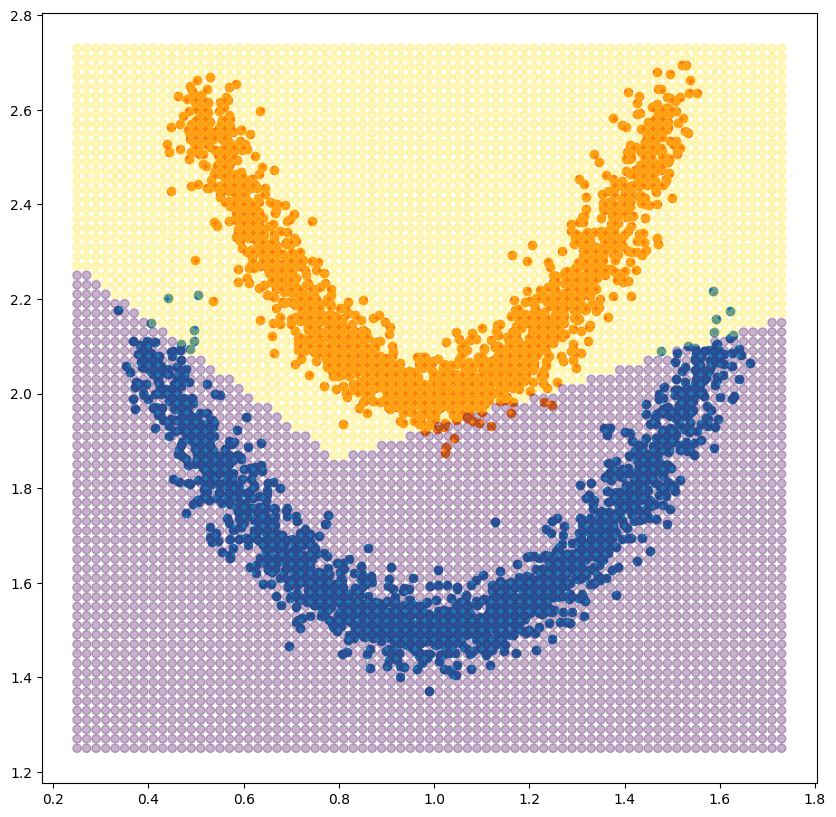

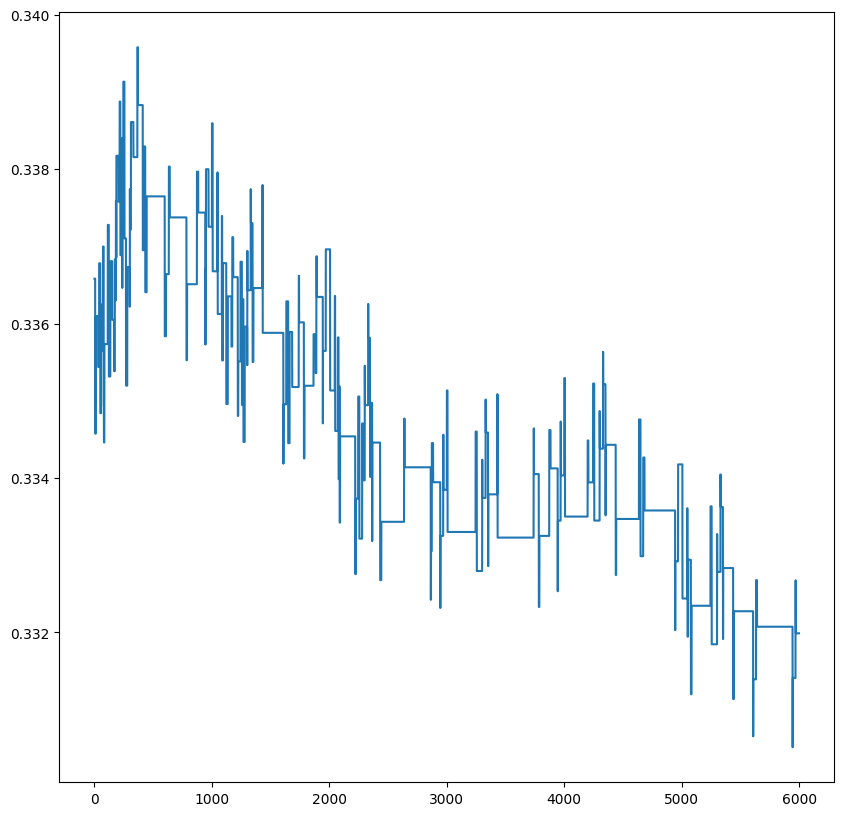

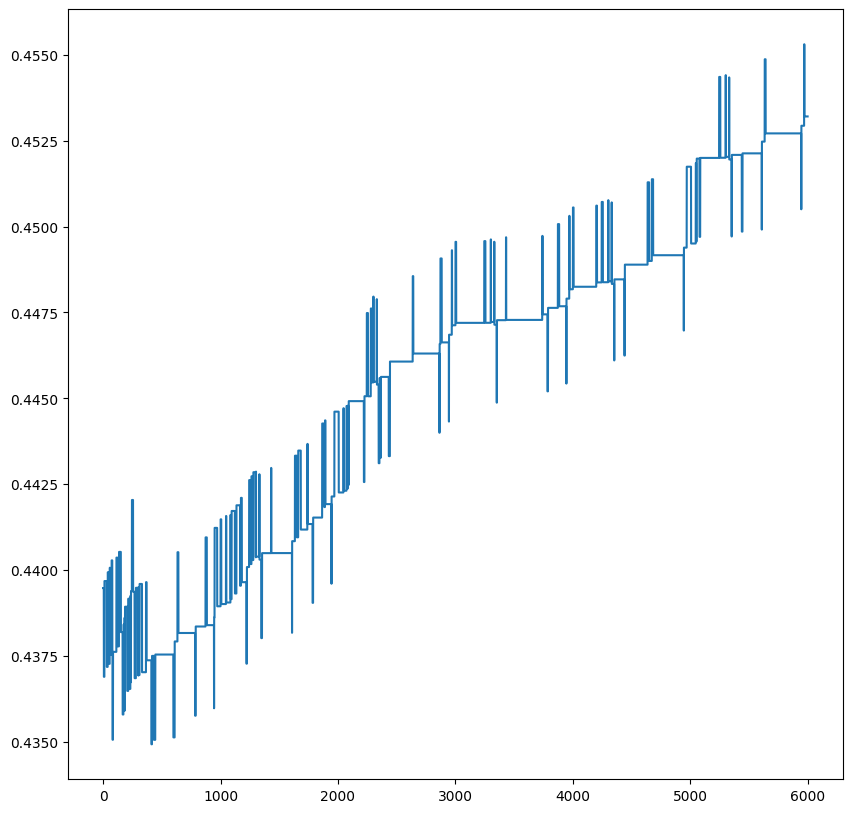

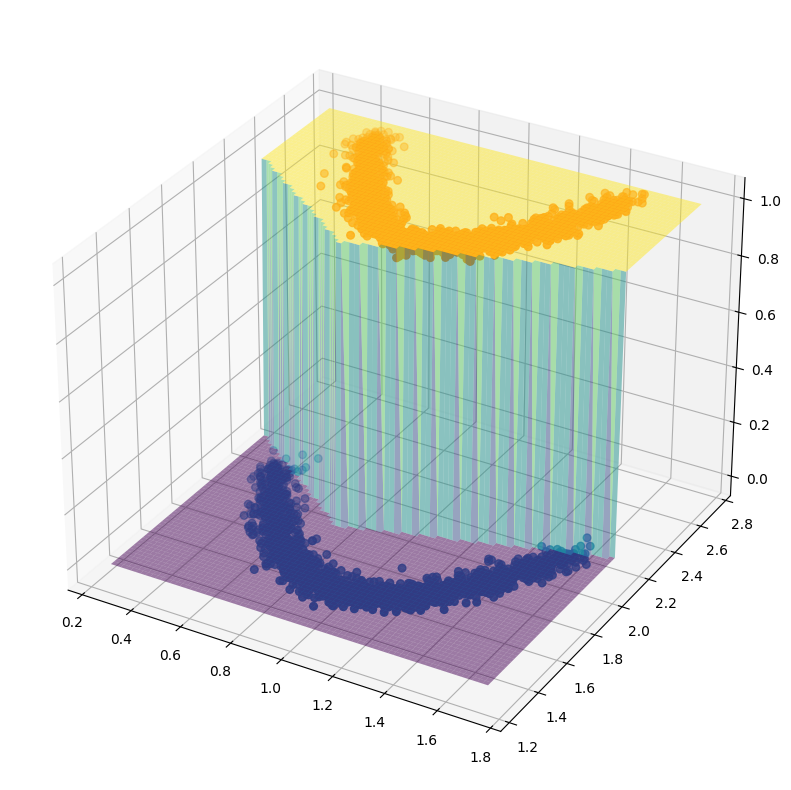

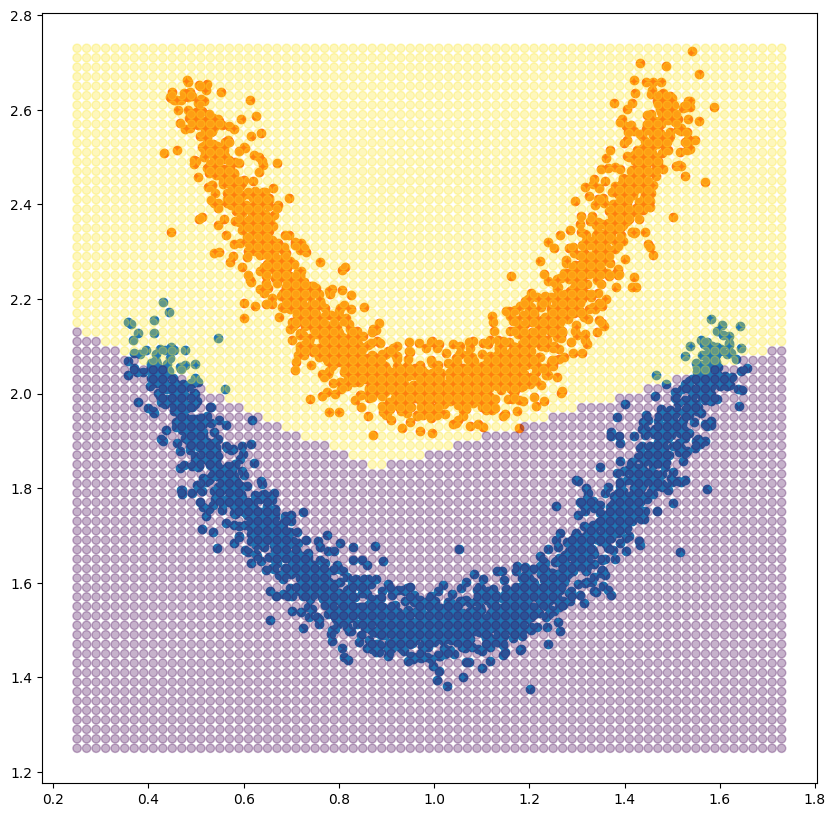

...

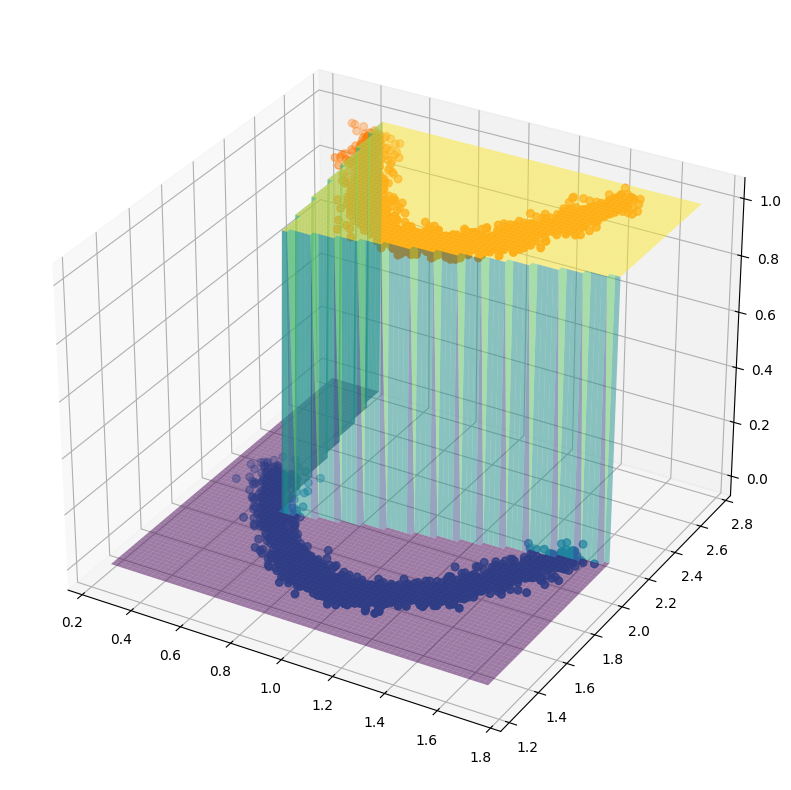

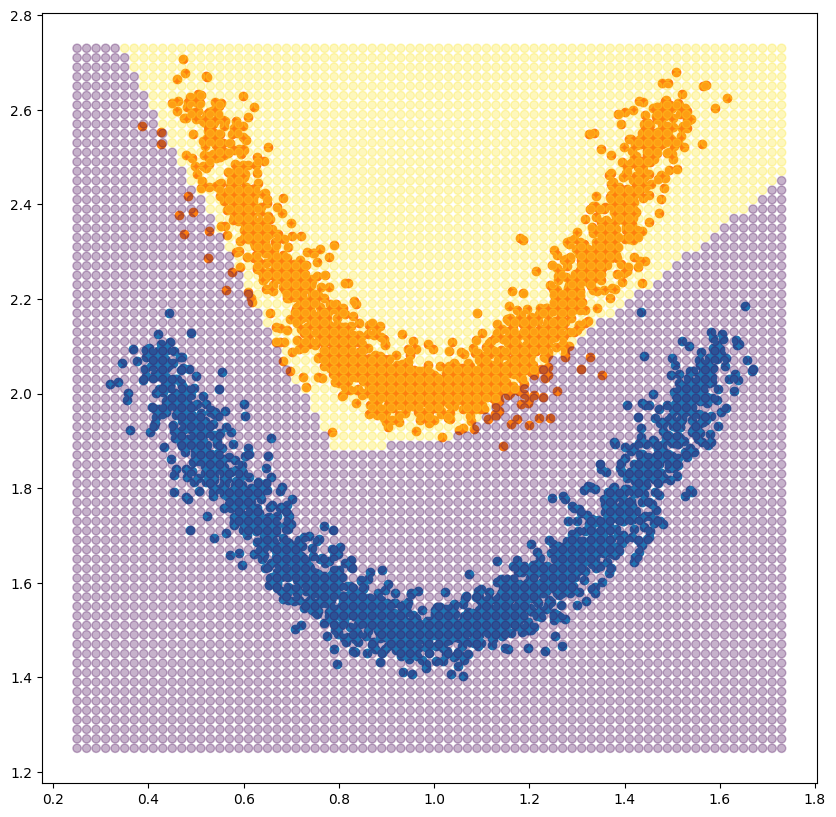

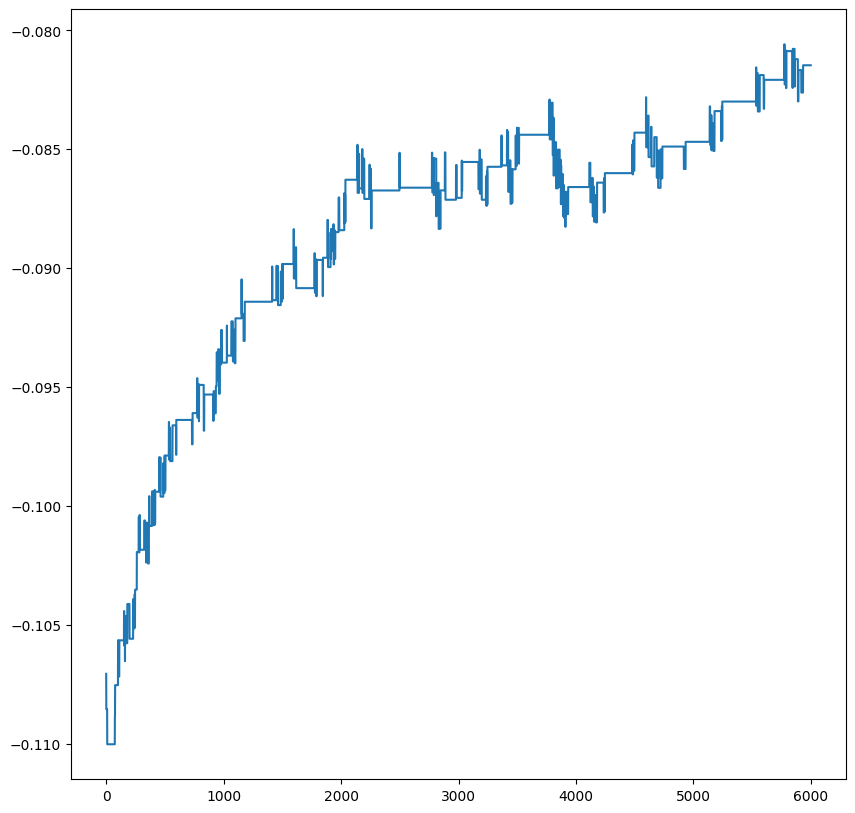

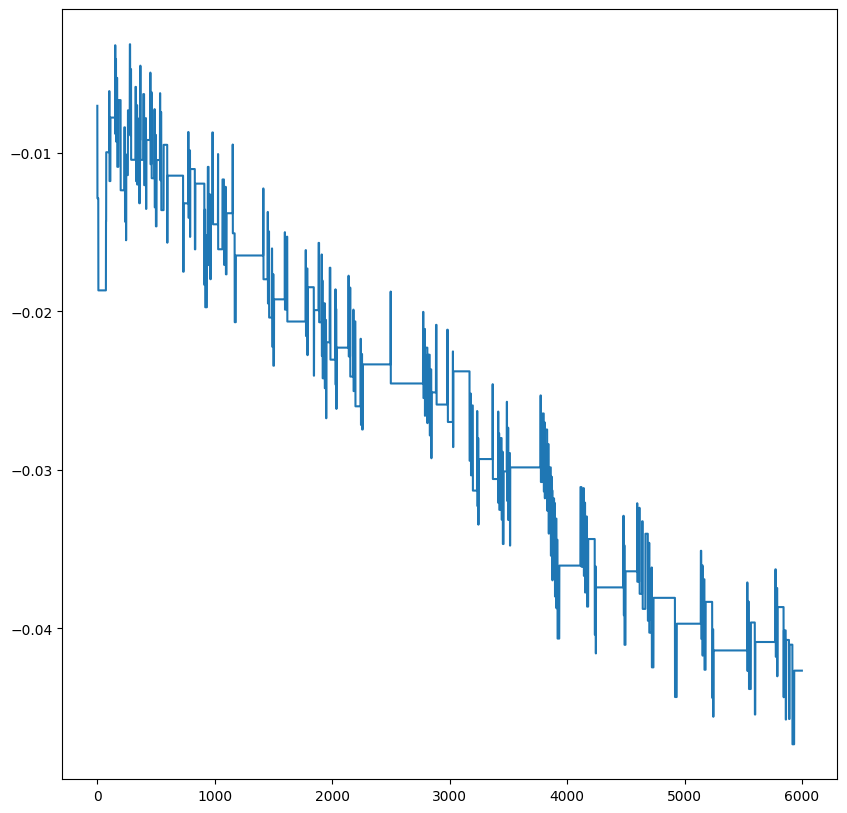

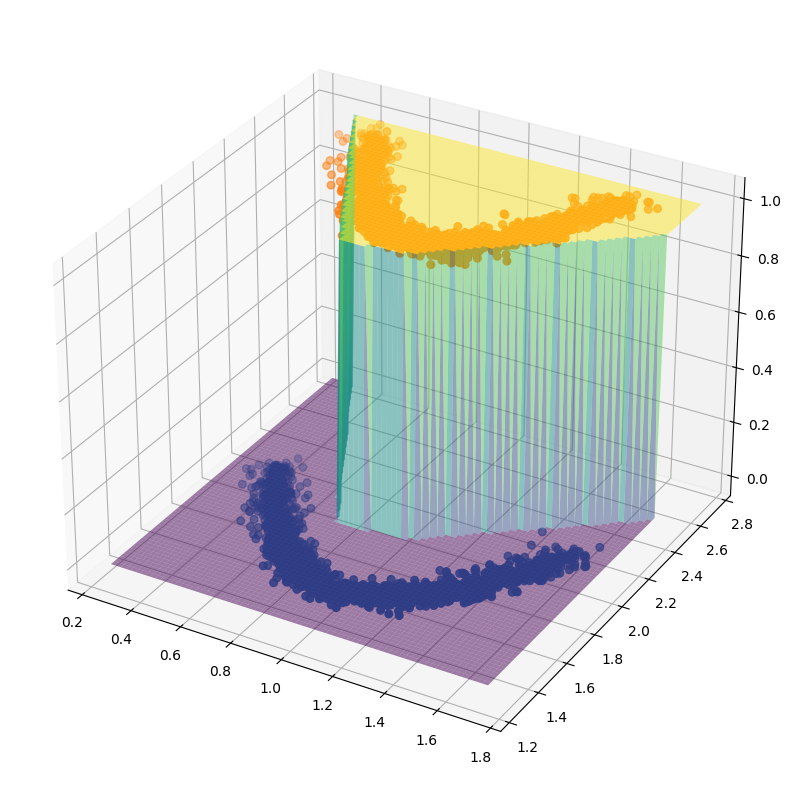

In [ ]:
##part D

import numpy as np
import random
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
nSuccess = 0

for zd in range(50):
  ####################### Parabolic clusters ###########################
  ##################### Synthetic Data Creation #########################
  nData = 2000 # number of points in each cluster
  nTrain = 1000
  nEpoch = 6 # number of training points
  nTest = 2000 # number of test points
  alpha = 0.007 # step size (learning rate)
  std = 0.5 # standard deviation of the distance of points
  x = np.zeros((2 * nData, 2)) # pre-allocate for the input and the
  t = np.zeros((2 * nData)) # target vector.
  r = np.random.normal(0, std, 2 * nData)
  the = 2 * np.pi * np.random.rand(2 * nData)
  w11f = np.zeros(nEpoch * nTrain)
  w12f = np.zeros(nEpoch * nTrain)
  h = -6 + 12 * np.random.rand(nData)
  v = 5 + (h ** 2) / 6
  x[0:nData, 0] = h + r[0:nData] * np.cos(the[0:nData])
  x[0:nData, 1] = v + r[0:nData] * np.sin(the[0:nData])
  t[0:nData] = 0
  h = -5 + 10 * np.random.rand(nData)
  v = 10 + (h ** 2) / 4
  x[nData:2 * nData, 0] = h + r[nData:2 * nData] * np.cos(the[nData:2 * nData])
  x[nData:2 * nData, 1] = v + r[nData:2 * nData] * np.sin(the[nData:2 * nData])
  t[nData:2 * nData] = 1

  ####################### Normalization ################################
  x[:, 0] = 1 + 0.1 * x[:, 0]
  x[:, 1] = 1 + 0.1 * x[:, 1]

  #################### Parameter Initialization #########################
  w11 = 0.5 - np.random.rand()
  w12 = 0.5 - np.random.rand()
  w21 = 0.5 - np.random.rand()
  w22 = 0.5 - np.random.rand()
  b2 = 0.5 - np.random.rand()
  b1 = 0.5 - np.random.rand()
  ww1 = 0.5 - np.random.rand()
  ww2 = 0.5 - np.random.rand()
  bb = 0.5 - np.random.rand()

  a = range(0, 2 * nData)
  sp = random.sample(a, nTrain + nTest) # indexes for random selection of data for training and testing

  ########################### Training #################################
  p = 0
  for epoch in range(0, nEpoch):
      for i in range(0, nTrain):
          y1 = b1 + w11 * x[sp[i], 0] + w12 * x[sp[i], 1]
          y2 = b2 + w21 * x[sp[i], 0] + w22 * x[sp[i], 1]
          dxx1 = y1 > 0
          xx1 = y1 * dxx1
          dxx2 = y2 > 0
          xx2 = y2 * dxx2 # rect. activation
          yy = bb + ww1 * xx1 + ww2 * xx2
          yy = yy > 0
          e = t[sp[i]] - yy
          ww1 = ww1 + alpha * e * xx1
          ww2 = ww2 + alpha * e * xx2
          bb = bb + alpha * e
          w11 = w11 + alpha * e * ww1 * dxx1 * x[sp[i], 0]
          w12 = w12 + alpha * e * ww1 * dxx1 * x[sp[i], 1]
          w21 = w21 + alpha * e * ww2 * dxx2 * x[sp[i], 0]
          w22 = w22 + alpha * e * ww2 * dxx2 * x[sp[i], 1]
          b1 = b1 + alpha * e * ww1 * dxx1
          b2 = b2 + alpha * e * ww2 * dxx2
          w11f[p] = w11
          w12f[p] = w12
          p = p + 1

  ######################## Testing ######################################
  err = 0
  for i in range(nTrain, nTrain + nTest):
      y1 = b1 + w11 * x[sp[i], 0] + w12 * x[sp[i], 1]
      y2 = b2 + w21 * x[sp[i], 0] + w22 * x[sp[i], 1]
      dxx1 = y1 > 0
      xx1 = y1 * dxx1
      dxx2 = y2 > 0
      xx2 = y2 * dxx2 # rect. activation
      yy = bb + ww1 * xx1 + ww2 * xx2
      yy = yy > 0
      e = abs(t[sp[i]] - yy)
      err = err + e
  err = err / nTest
  print(err)
  if err < 0.05:
    nSuccess += 1

  ######################## Plotting Part ##############################
  if err < 0.05:
      plt.figure(figsize=(10, 10))
      plt.scatter(x[0:nData, 0], x[0:nData, 1])
      plt.scatter(x[nData:2 * nData, 0], x[nData:2 * nData, 1])

      X = np.arange(0.25, 1.75, 0.02)
      Y = np.arange(1.25, 2.75, 0.02)
      X, Y = np.meshgrid(X, Y)
      y1 = b1 + w11 * X + w12 * Y
      y2 = b2 + w21 * X + w22 * Y
      dxx1 = y1 > 0
      xx1 = y1 * dxx1
      dxx2 = y2 > 0
      xx2 = y2 * dxx2 # rect. activation
      yy = bb + ww1 * xx1 + ww2 * xx2
      Z = yy > 0
      plt.scatter(X, Y, c=Z+1, alpha=0.3)

      plt.figure(figsize=(10, 10))
      f = np.arange(0, nEpoch * nTrain, 1)
      plt.plot(f, w11f)

      plt.figure(figsize=(10, 10))
      plt.plot(f, w12f)

      plt.figure(figsize=(10, 10))
      ax = plt.axes(projection='3d')
      ax.scatter(x[0:nData, 0], x[0:nData, 1], 0, cmap='viridis', s=30)
      ax.scatter(x[nData:2 * nData, 0], x[nData:2 * nData, 1], 1, cmap='viridis', s=30)

      X = np.arange(0.25, 1.75, 0.02) # Shorter X-range for visibility
      Y = np.arange(1.25, 2.75, 0.02)
      X, Y = np.meshgrid(X, Y)
      y1 = b1 + w11 * X + w12 * Y
      y2 = b2 + w21 * X + w22 * Y
      dxx1 = y1 > 0
      xx1 = y1 * dxx1
      dxx2 = y2 > 0
      xx2 = y2 * dxx2 # rect. activation
      yy = bb + ww1 * xx1 + ww2 * xx2
      Z = yy > 0
      ax.plot_surface(X, Y, Z, rstride=1, cstride=1, cmap='viridis', alpha=0.5)

print(nSuccess)

# Exercise 6.6.2

<ipython-input-8-060485048603>:160: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(x[0:nData, 0], x[0:nData, 1], 0, cmap='viridis', s=30)
<ipython-input-8-060485048603>:161: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(x[nData:2 * nData, 0], x[nData:2 * nData, 1], 1, cmap='viridis', s=30)
<ipython-input-8-060485048603>:127: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(10, 10))


0.02 4 7


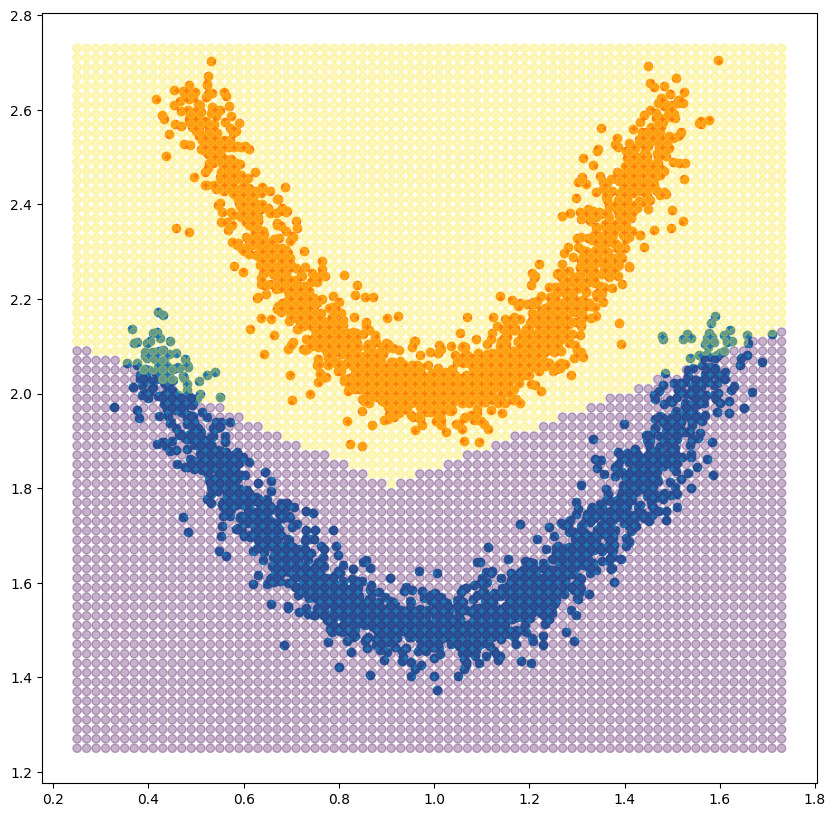

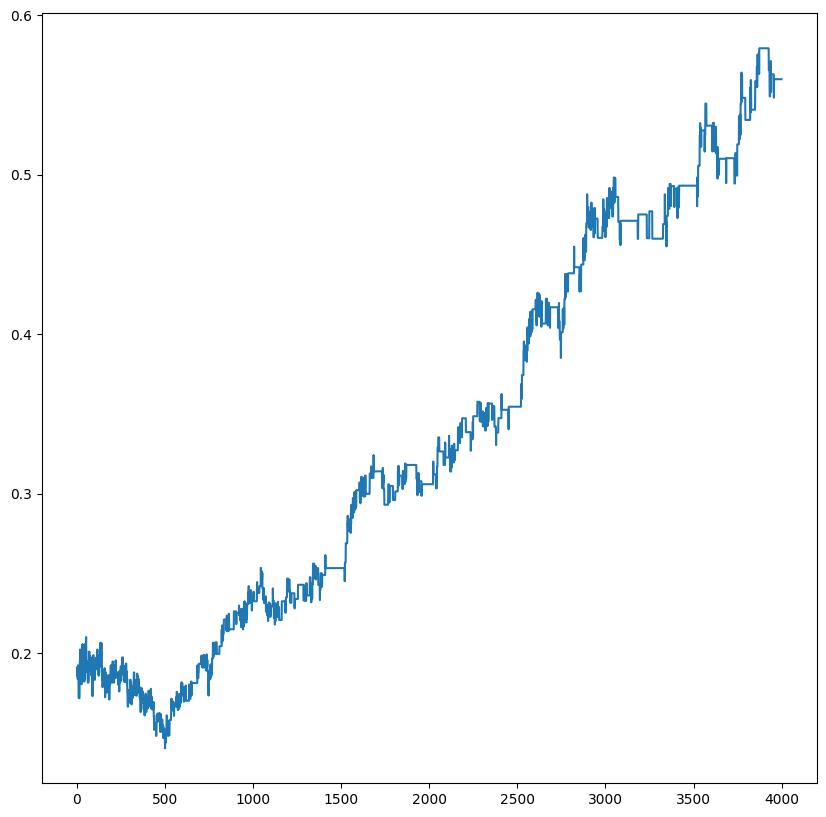

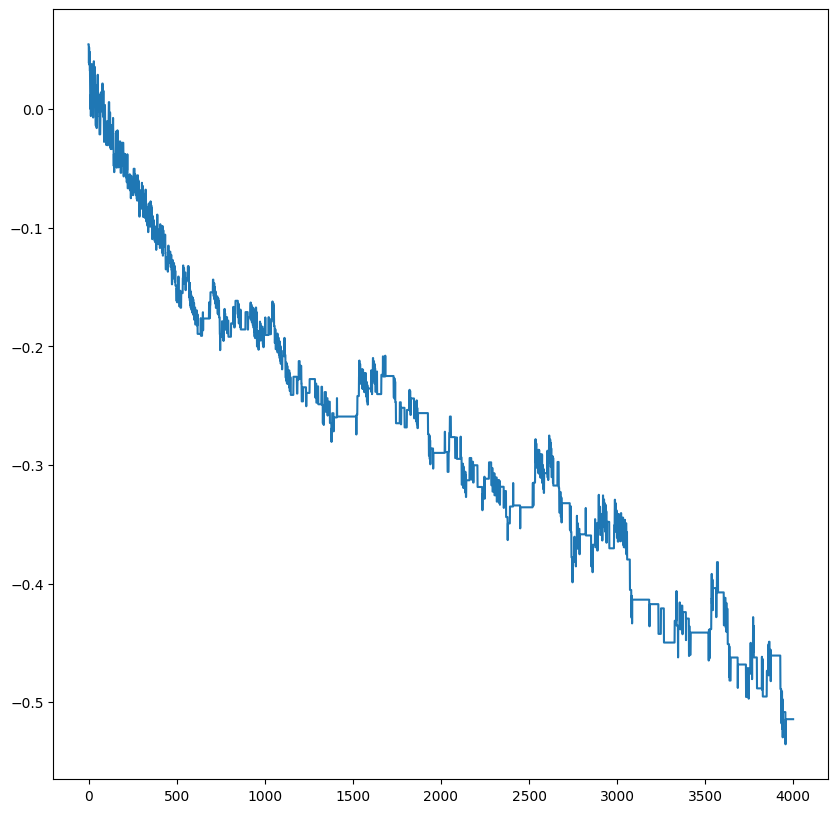

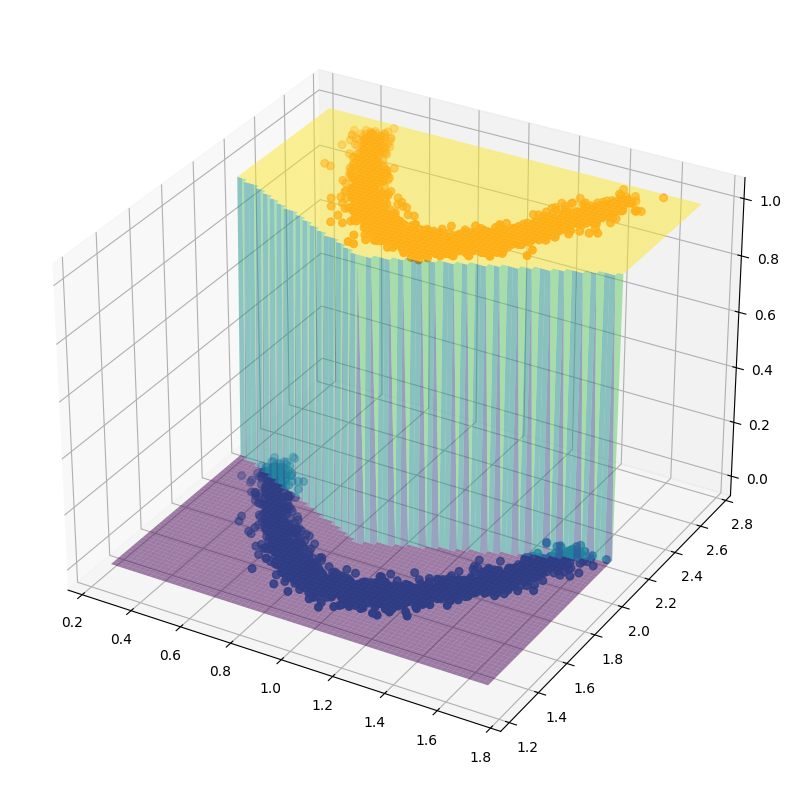

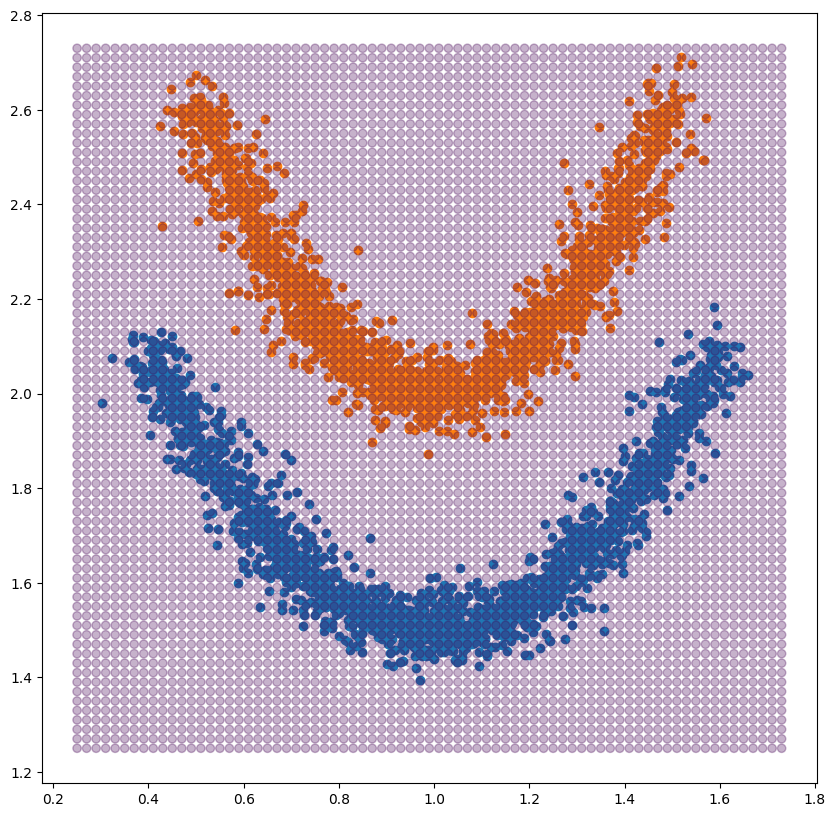

...

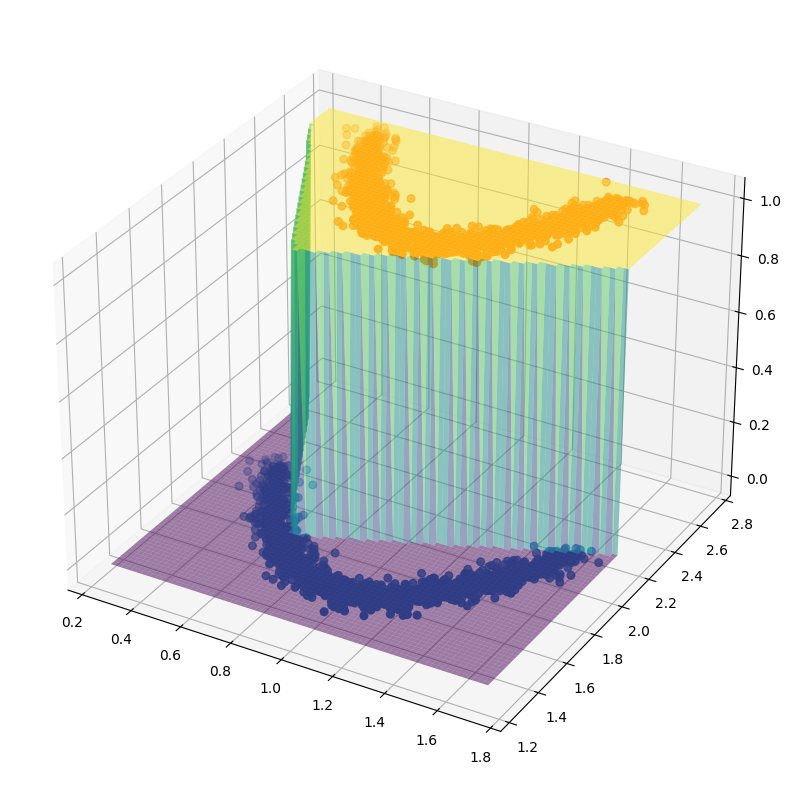

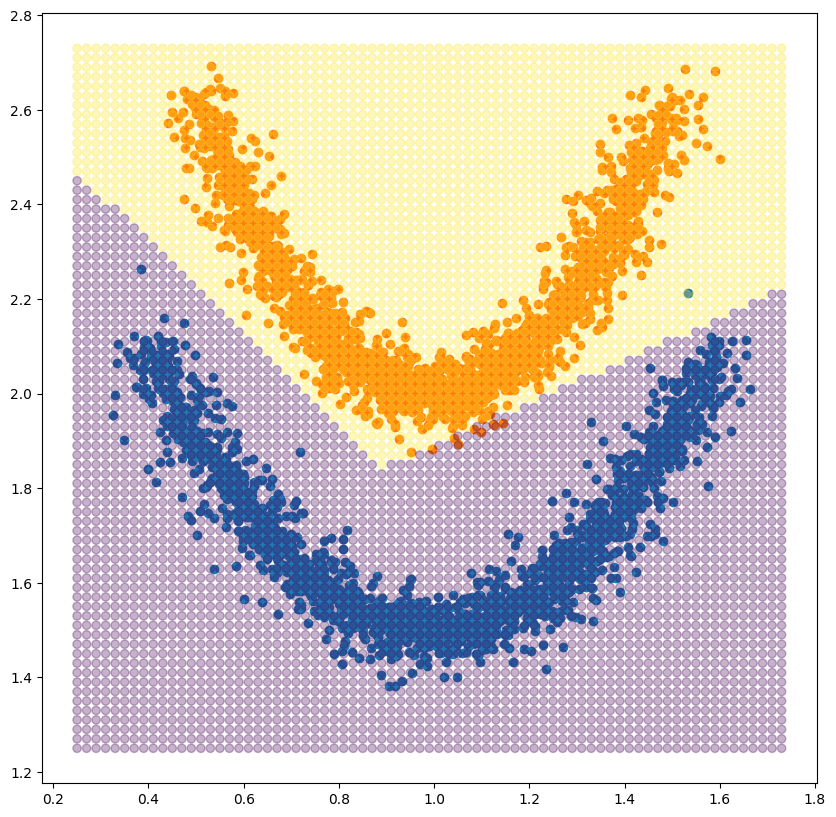

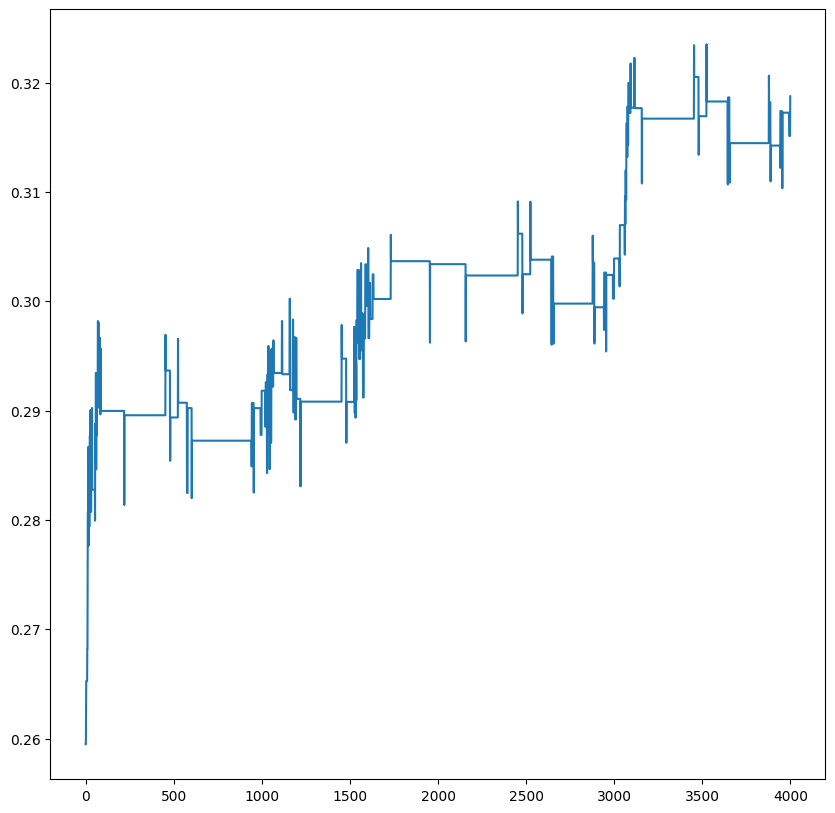

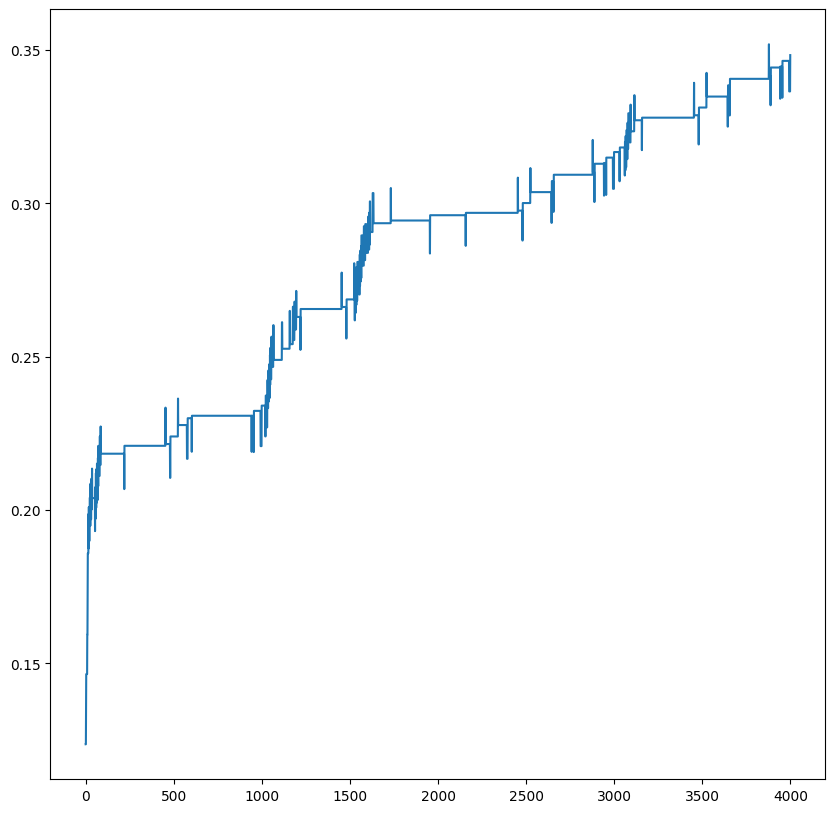

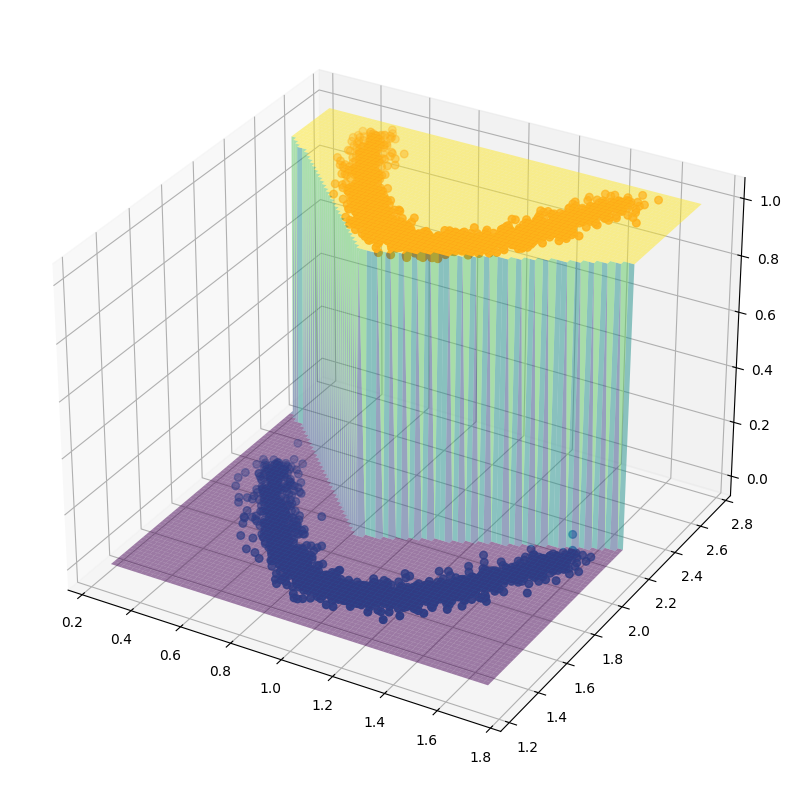

In [8]:
##part D

import numpy as np
import random
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

####################### Parabolic clusters ###########################
##################### Synthetic Data Creation #########################
for zd in range(50):
  nData = 2000 # number of points in each cluster
  nTrain = 1000
  nEpoch = 4 # number of training points
  nTest = 2000 # number of test points
  alpha = 0.02 # step size (learning rate)
  std = 0.5 # standard deviation of the distance of points
  x = np.zeros((2 * nData, 2)) # pre-allocate for the input and the
  t = np.zeros((2 * nData)) # target vector.
  r = np.random.normal(0, std, 2 * nData)
  the = 2 * np.pi * np.random.rand(2 * nData)
  w11f = np.zeros(nEpoch * nTrain)
  w12f = np.zeros(nEpoch * nTrain)
  h = -6 + 12 * np.random.rand(nData)
  v = 5 + (h ** 2) / 6
  x[0:nData, 0] = h + r[0:nData] * np.cos(the[0:nData])
  x[0:nData, 1] = v + r[0:nData] * np.sin(the[0:nData])
  t[0:nData] = 0
  h = -5 + 10 * np.random.rand(nData)
  v = 10 + (h ** 2) / 4
  x[nData:2 * nData, 0] = h + r[nData:2 * nData] * np.cos(the[nData:2 * nData])
  x[nData:2 * nData, 1] = v + r[nData:2 * nData] * np.sin(the[nData:2 * nData])
  t[nData:2 * nData] = 1

  ####################### Normalization ################################
  x[:, 0] = 1 + 0.1 * x[:, 0]
  x[:, 1] = 1 + 0.1 * x[:, 1]

  #################### Parameter Initialization #########################
  w11 = 0.5 - np.random.rand()
  w12 = 0.5 - np.random.rand()
  w21 = 0.5 - np.random.rand()
  w22 = 0.5 - np.random.rand()
  w31 = 0.5 - np.random.rand()
  w32 = 0.5 - np.random.rand()
  w41 = 0.5 - np.random.rand()
  w42 = 0.5 - np.random.rand()
  b2 = 0.5 - np.random.rand()
  b1 = 0.5 - np.random.rand()
  b3 = 0.5 - np.random.rand()
  b4 = 0.5 - np.random.rand()
  ww1 = 0.5 - np.random.rand()
  ww2 = 0.5 - np.random.rand()
  ww3 = 0.5 - np.random.rand()
  ww4 = 0.5 - np.random.rand()
  bb = 0.5 - np.random.rand()

  a = range(0, 2 * nData)
  sp = random.sample(a, nTrain + nTest) # indexes for random selection of data for training and testing

  ########################### Training #################################
  p = 0
  for epoch in range(0, nEpoch):
      for i in range(0, nTrain):
          y1 = b1 + w11 * x[sp[i], 0] + w12 * x[sp[i], 1]
          y2 = b2 + w21 * x[sp[i], 0] + w22 * x[sp[i], 1]
          y3 = b3 + w31 * x[sp[i], 0] + w32 * x[sp[i], 1]
          y4 = b4 + w41 * x[sp[i], 0] + w42 * x[sp[i], 1]
          dxx1 = y1 > 0
          xx1 = y1 * dxx1
          dxx2 = y2 > 0
          xx2 = y2 * dxx2 # rect. activation
          dxx3 = y3 > 0
          xx3 = y3 * dxx3
          dxx4 = y4 > 0
          xx4 = y4 * dxx4 # rect. activation
          yy = bb + ww1 * xx1 + ww2 * xx2 + ww3 * xx3 + ww4 * xx4
          yy = yy > 0
          e = t[sp[i]] - yy
          ww1 = ww1 + alpha * e * xx1
          ww2 = ww2 + alpha * e * xx2
          ww3 = ww3 + alpha * e * xx3
          ww4 = ww4 + alpha * e * xx4
          bb = bb + alpha * e
          w11 = w11 + alpha * e * ww1 * dxx1 * x[sp[i], 0]
          w12 = w12 + alpha * e * ww1 * dxx1 * x[sp[i], 1]
          w21 = w21 + alpha * e * ww2 * dxx2 * x[sp[i], 0]
          w22 = w22 + alpha * e * ww2 * dxx2 * x[sp[i], 1]
          w31 = w31 + alpha * e * ww3 * dxx3 * x[sp[i], 0]
          w32 = w32 + alpha * e * ww3 * dxx3 * x[sp[i], 1]
          w41 = w41 + alpha * e * ww4 * dxx4 * x[sp[i], 0]
          w42 = w42 + alpha * e * ww4 * dxx4 * x[sp[i], 1]

          b1 = b1 + alpha * e * ww1 * dxx1
          b2 = b2 + alpha * e * ww2 * dxx2
          b3 = b3 + alpha * e * ww3 * dxx3
          b4 = b4 + alpha * e * ww4 * dxx4
          w11f[p] = w11
          w12f[p] = w12
          p = p + 1

  ######################## Testing ######################################
  err = 0
  for i in range(nTrain, nTrain + nTest):
      y1 = b1 + w11 * x[sp[i], 0] + w12 * x[sp[i], 1]
      y2 = b2 + w21 * x[sp[i], 0] + w22 * x[sp[i], 1]
      y3 = b3 + w31 * x[sp[i], 0] + w32 * x[sp[i], 1]
      y4 = b4 + w41 * x[sp[i], 0] + w42 * x[sp[i], 1]
      dxx1 = y1 > 0
      xx1 = y1 * dxx1
      dxx2 = y2 > 0
      xx2 = y2 * dxx2 # rect. activation
      dxx3 = y3 > 0
      xx3 = y3 * dxx3
      dxx4 = y4 > 0
      xx4 = y4 * dxx4 # rect. activation
      yy = bb + ww1 * xx1 + ww2 * xx2 + ww3 * xx3 + ww4 * xx4
      yy = yy > 0
      e = abs(t[sp[i]] - yy)
      err = err + e
  err = err / nTest
  #print(err)
  if err < 0.05:
    nSuccess += 1

  ####################### Plotting Part ##############################
  if err < 0.05:
      plt.figure(figsize=(10, 10))
      plt.scatter(x[0:nData, 0], x[0:nData, 1])
      plt.scatter(x[nData:2 * nData, 0], x[nData:2 * nData, 1])

      X = np.arange(0.25, 1.75, 0.02)
      Y = np.arange(1.25, 2.75, 0.02)
      X, Y = np.meshgrid(X, Y)
      y1 = b1 + w11 * X + w12 * Y
      y2 = b2 + w21 * X + w12 * Y
      y3 = b3 + w31 * X + w32 * Y
      y4 = b4 + w41 * X + w42 * Y
      dxx1 = y1 > 0
      xx1 = y1 * dxx1
      dxx2 = y2 > 0
      xx2 = y2 * dxx2 # rect. activation
      dxx3 = y3 > 0
      xx3 = y3 * dxx3
      dxx4 = y4 > 0
      xx4 = y4 * dxx4 # rect. activation
      yy = bb + ww1 * xx1 + ww2 * xx2
      yy = yy + ww3 * xx3 + ww4 * xx4
      Z = yy > 0
      plt.scatter(X, Y, c=Z+1, alpha=0.3)

      plt.figure(figsize=(10, 10))
      f = np.arange(0, nEpoch * nTrain, 1)
      plt.plot(f, w11f)

      plt.figure(figsize=(10, 10))
      plt.plot(f, w12f)

      plt.figure(figsize=(10, 10))
      ax = plt.axes(projection='3d')
      ax.scatter(x[0:nData, 0], x[0:nData, 1], 0, cmap='viridis', s=30)
      ax.scatter(x[nData:2 * nData, 0], x[nData:2 * nData, 1], 1, cmap='viridis', s=30)

      X = np.arange(0.25, 1.75, 0.02) # Shorter X-range for visibility
      Y = np.arange(1.25, 2.75, 0.02)
      X, Y = np.meshgrid(X, Y)
      y1 = b1 + w11 * X + w12 * Y
      y2 = b2 + w21 * X + w12 * Y
      y3 = b3 + w31 * X + w32 * Y
      y4 = b4 + w41 * X + w42 * Y
      dxx1 = y1 > 0
      xx1 = y1 * dxx1
      dxx2 = y2 > 0
      xx2 = y2 * dxx2 # rect. activation
      dxx3 = y3 > 0
      xx3 = y3 * dxx3
      dxx3 = y3 > 0
      xx4 = y3 * dxx3 # rect. activation
      xx4 = y4 * dxx4
      dxx4 = y4 > 0
      xx4 = y4 * dxx4 # rect. activation
      yy = bb + ww1 * xx1 + ww2 * xx2 + ww3 * xx3 + ww4 * xx4
      yy = yy > 0
      Z = yy > 0
      ax.plot_surface(X, Y, Z, rstride=1, cstride=1, cmap='viridis', alpha=0.5)

print(alpha, nEpoch, nSuccess)

# Exercise 6.6.4

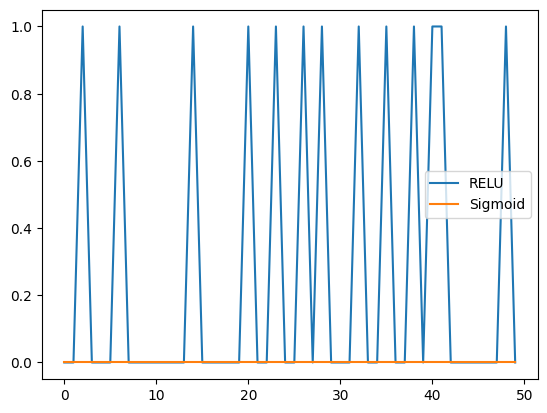

In [ ]:
import numpy as np
import random
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

nRuns = np.zeros((50, 1)) #nData_plot[:, 0] is for RELU while nData_plot[:, 1] is sigmoid
nSuccess_plot = np.zeros((50, 2))

##RELU remember the back propagation involves the derivative of the activating function

####################### Parabolic clusters ###########################
##################### Synthetic Data Creation #########################

for zd in range(50):
  nSuccess = 0
  nRuns[zd] = zd
  nData = 2000 # number of points in each cluster
  nTrain = 1000
  nEpoch = 4 # number of training points
  nTest = 2000 # number of test points
  alpha = 0.02 # step size (learning rate)
  std = 0.5 # standard deviation of the distance of points
  x = np.zeros((2 * nData, 2)) # pre-allocate for the input and the
  t = np.zeros((2 * nData)) # target vector.
  r = np.random.normal(0, std, 2 * nData)
  the = 2 * np.pi * np.random.rand(2 * nData)
  w11f = np.zeros(nEpoch * nTrain)
  w12f = np.zeros(nEpoch * nTrain)
  h = -6 + 12 * np.random.rand(nData)
  v = 5 + (h ** 2) / 6
  x[0:nData, 0] = h + r[0:nData] * np.cos(the[0:nData])
  x[0:nData, 1] = v + r[0:nData] * np.sin(the[0:nData])
  t[0:nData] = 0
  h = -5 + 10 * np.random.rand(nData)
  v = 10 + (h ** 2) / 4
  x[nData:2 * nData, 0] = h + r[nData:2 * nData] * np.cos(the[nData:2 * nData])
  x[nData:2 * nData, 1] = v + r[nData:2 * nData] * np.sin(the[nData:2 * nData])
  t[nData:2 * nData] = 1

  ####################### Normalization ################################
  x[:, 0] = 1 + 0.1 * x[:, 0]
  x[:, 1] = 1 + 0.1 * x[:, 1]

  #################### Parameter Initialization #########################
  w11 = 0.5 - np.random.rand()
  w12 = 0.5 - np.random.rand()
  w21 = 0.5 - np.random.rand()
  w22 = 0.5 - np.random.rand()
  w31 = 0.5 - np.random.rand()
  w32 = 0.5 - np.random.rand()
  w41 = 0.5 - np.random.rand()
  w42 = 0.5 - np.random.rand()
  b2 = 0.5 - np.random.rand()
  b1 = 0.5 - np.random.rand()
  b3 = 0.5 - np.random.rand()
  b4 = 0.5 - np.random.rand()
  ww1 = 0.5 - np.random.rand()
  ww2 = 0.5 - np.random.rand()
  ww3 = 0.5 - np.random.rand()
  ww4 = 0.5 - np.random.rand()
  bb = 0.5 - np.random.rand()

  a = range(0, 2 * nData)
  sp = random.sample(a, nTrain + nTest) # indexes for random selection of data for training and testing

  ########################### Training #################################
  p = 0
  for epoch in range(0, nEpoch):
      for i in range(0, nTrain):
          y1 = b1 + w11 * x[sp[i], 0] + w12 * x[sp[i], 1]
          y2 = b2 + w21 * x[sp[i], 0] + w22 * x[sp[i], 1]
          y3 = b3 + w31 * x[sp[i], 0] + w32 * x[sp[i], 1]
          y4 = b4 + w41 * x[sp[i], 0] + w42 * x[sp[i], 1]
          dxx1 = y1 > 0
          xx1 = y1 * dxx1
          dxx2 = y2 > 0
          xx2 = y2 * dxx2 # rect. activation
          dxx3 = y3 > 0
          xx3 = y3 * dxx3
          dxx4 = y4 > 0
          xx4 = y4 * dxx4 # rect. activation
          yy = bb + ww1 * xx1 + ww2 * xx2 + ww3 * xx3 + ww4 * xx4
          yy = yy > 0
          e = t[sp[i]] - yy
          ww1 = ww1 + alpha * e * xx1
          ww2 = ww2 + alpha * e * xx2
          ww3 = ww3 + alpha * e * xx3
          ww4 = ww4 + alpha * e * xx4
          bb = bb + alpha * e
          w11 = w11 + alpha * e * ww1 * dxx1 * x[sp[i], 0]
          w12 = w12 + alpha * e * ww1 * dxx1 * x[sp[i], 1]
          w21 = w21 + alpha * e * ww2 * dxx2 * x[sp[i], 0]
          w22 = w22 + alpha * e * ww2 * dxx2 * x[sp[i], 1]
          w31 = w31 + alpha * e * ww3 * dxx3 * x[sp[i], 0]
          w32 = w32 + alpha * e * ww3 * dxx3 * x[sp[i], 1]
          w41 = w41 + alpha * e * ww4 * dxx4 * x[sp[i], 0]
          w42 = w42 + alpha * e * ww4 * dxx4 * x[sp[i], 1]

          b1 = b1 + alpha * e * ww1 * dxx1
          b2 = b2 + alpha * e * ww2 * dxx2
          b3 = b3 + alpha * e * ww3 * dxx3
          b4 = b4 + alpha * e * ww4 * dxx4
          w11f[p] = w11
          w12f[p] = w12
          p = p + 1

  ######################## Testing ######################################
  err = 0
  for i in range(nTrain, nTrain + nTest):
      y1 = b1 + w11 * x[sp[i], 0] + w12 * x[sp[i], 1]
      y2 = b2 + w21 * x[sp[i], 0] + w22 * x[sp[i], 1]
      y3 = b3 + w31 * x[sp[i], 0] + w32 * x[sp[i], 1]
      y4 = b4 + w41 * x[sp[i], 0] + w42 * x[sp[i], 1]
      dxx1 = y1 > 0
      xx1 = y1 * dxx1
      dxx2 = y2 > 0
      xx2 = y2 * dxx2 # rect. activation
      dxx3 = y3 > 0
      xx3 = y3 * dxx3
      dxx4 = y4 > 0
      xx4 = y4 * dxx4 # rect. activation
      yy = bb + ww1 * xx1 + ww2 * xx2 + ww3 * xx3 + ww4 * xx4
      yy = yy > 0
      e = abs(t[sp[i]] - yy)
      err = err + e
  err = err / nTest
  #print(err)
  if err < 0.05:
    nSuccess += 1
  nSuccess_plot[zd, 0] = nSuccess
def sigmoid(input):
  return 1 / (1 + np.exp(-input))
def deriv_sigmoid(input):
  return sigmoid(input) * (1 - sigmoid(input))
## sigmoid activating function
for zd in range(50):
  nSuccess = 0
  nRuns[zd] = zd
  nData = 2000 # number of points in each cluster
  nTrain = 1000
  nEpoch = 4 # number of training points
  nTest = 2000 # number of test points
  alpha = 0.02 # step size (learning rate)
  std = 0.5 # standard deviation of the distance of points
  x = np.zeros((2 * nData, 2)) # pre-allocate for the input and the
  t = np.zeros((2 * nData)) # target vector.
  r = np.random.normal(0, std, 2 * nData)
  the = 2 * np.pi * np.random.rand(2 * nData)
  w11f = np.zeros(nEpoch * nTrain)
  w12f = np.zeros(nEpoch * nTrain)
  h = -6 + 12 * np.random.rand(nData)
  v = 5 + (h ** 2) / 6
  x[0:nData, 0] = h + r[0:nData] * np.cos(the[0:nData])
  x[0:nData, 1] = v + r[0:nData] * np.sin(the[0:nData])
  t[0:nData] = 0
  h = -5 + 10 * np.random.rand(nData)
  v = 10 + (h ** 2) / 4
  x[nData:2 * nData, 0] = h + r[nData:2 * nData] * np.cos(the[nData:2 * nData])
  x[nData:2 * nData, 1] = v + r[nData:2 * nData] * np.sin(the[nData:2 * nData])
  t[nData:2 * nData] = 1

  ####################### Normalization ################################
  x[:, 0] = 1 + 0.1 * x[:, 0]
  x[:, 1] = 1 + 0.1 * x[:, 1]

  #################### Parameter Initialization #########################
  w11 = 0.5 - np.random.rand()
  w12 = 0.5 - np.random.rand()
  w21 = 0.5 - np.random.rand()
  w22 = 0.5 - np.random.rand()
  w31 = 0.5 - np.random.rand()
  w32 = 0.5 - np.random.rand()
  w41 = 0.5 - np.random.rand()
  w42 = 0.5 - np.random.rand()
  b2 = 0.5 - np.random.rand()
  b1 = 0.5 - np.random.rand()
  b3 = 0.5 - np.random.rand()
  b4 = 0.5 - np.random.rand()
  ww1 = 0.5 - np.random.rand()
  ww2 = 0.5 - np.random.rand()
  ww3 = 0.5 - np.random.rand()
  ww4 = 0.5 - np.random.rand()
  bb = 0.5 - np.random.rand()

  a = range(0, 2 * nData)
  sp = random.sample(a, nTrain + nTest) # indexes for random selection of data for training and testing

  ########################### Training #################################
  p = 0
  for epoch in range(0, nEpoch):
      for i in range(0, nTrain):
          y1 = b1 + w11 * x[sp[i], 0] + w12 * x[sp[i], 1]
          y2 = b2 + w21 * x[sp[i], 0] + w22 * x[sp[i], 1]
          y3 = b3 + w31 * x[sp[i], 0] + w32 * x[sp[i], 1]
          y4 = b4 + w41 * x[sp[i], 0] + w42 * x[sp[i], 1]
          xx1 = sigmoid(y1)
          xx2 = sigmoid(y2)
          xx3 = sigmoid(y3)
          xx4 = sigmoid(y4) ##Sigmoid activation
          yy = bb + ww1 * xx1 + ww2 * xx2 + ww3 * xx3 + ww4 * xx4
          yy = sigmoid(yy)
          e = t[sp[i]] - yy
          ww1 = ww1 + alpha * e * xx1
          ww2 = ww2 + alpha * e * xx2
          ww3 = ww3 + alpha * e * xx3
          ww4 = ww4 + alpha * e * xx4
          bb = bb + alpha * e
          w11 = w11 + alpha * e * ww1 * deriv_sigmoid(y1) * x[sp[i], 0]
          w12 = w12 + alpha * e * ww1 * deriv_sigmoid(y1) * x[sp[i], 1]
          w21 = w21 + alpha * e * ww2 * deriv_sigmoid(y2) * x[sp[i], 0]
          w22 = w22 + alpha * e * ww2 * deriv_sigmoid(y2) * x[sp[i], 1]
          w31 = w31 + alpha * e * ww3 * deriv_sigmoid(y3) * x[sp[i], 0]
          w32 = w32 + alpha * e * ww3 * deriv_sigmoid(y3) * x[sp[i], 1]
          w41 = w41 + alpha * e * ww4 * deriv_sigmoid(y4) * x[sp[i], 0]
          w42 = w42 + alpha * e * ww4 * deriv_sigmoid(y4) * x[sp[i], 1]

          b1 = b1 + alpha * e * ww1 * deriv_sigmoid(y1)
          b2 = b2 + alpha * e * ww2 * deriv_sigmoid(y2)
          b3 = b3 + alpha * e * ww3 * deriv_sigmoid(y3)
          b4 = b4 + alpha * e * ww4 * deriv_sigmoid(y4)
          w11f[p] = w11
          w12f[p] = w12
          p = p + 1

  ######################## Testing ######################################
  err = 0
  for i in range(nTrain, nTrain + nTest):
      y1 = b1 + w11 * x[sp[i], 0] + w12 * x[sp[i], 1]
      y2 = b2 + w21 * x[sp[i], 0] + w22 * x[sp[i], 1]
      y3 = b3 + w31 * x[sp[i], 0] + w32 * x[sp[i], 1]
      y4 = b4 + w41 * x[sp[i], 0] + w42 * x[sp[i], 1]
      xx1 = sigmoid(y1)
      xx2 = sigmoid(y2)
      xx3 = sigmoid(y3)
      xx4 = sigmoid(y4) ##Sigmoid activation
      yy = bb + ww1 * xx1 + ww2 * xx2 + ww3 * xx3 + ww4 * xx4
      yy = sigmoid(yy)
      e = abs(t[sp[i]] - yy)
      err = err + e
  err = err / nTest
  #print(err)
  if err < 0.05:
    nSuccess += 1
  nSuccess_plot[zd, 1] = nSuccess

plt.plot(nRuns, nSuccess_plot[:, 0], label='RELU')
plt.plot(nRuns, nSuccess_plot[:, 1], label='Sigmoid')
plt.legend()
plt.show()
#plot for number of runs and number of erros less than 0.05

# Exercise 6.6.5

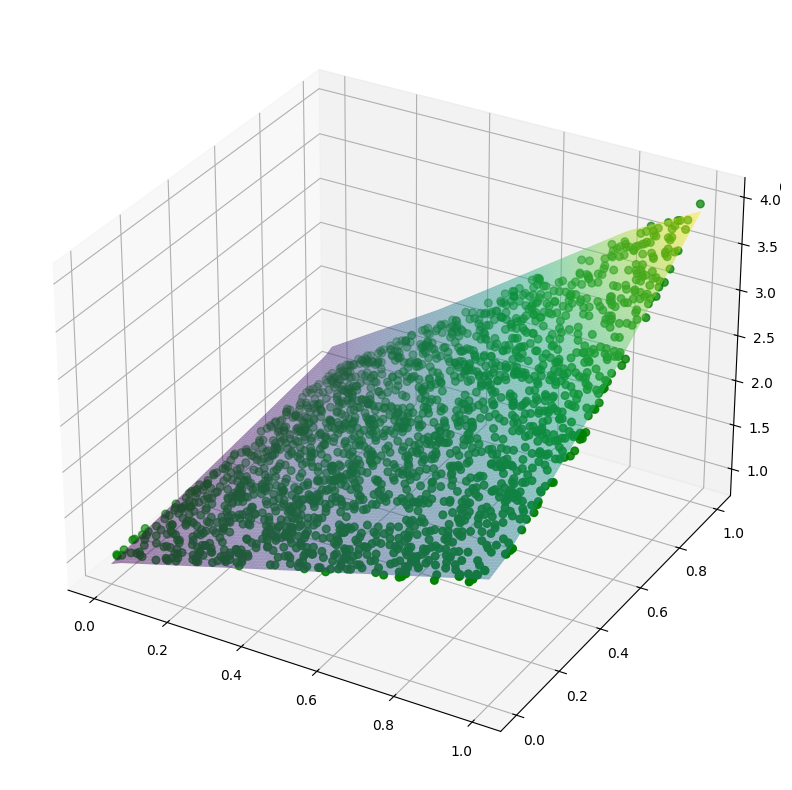

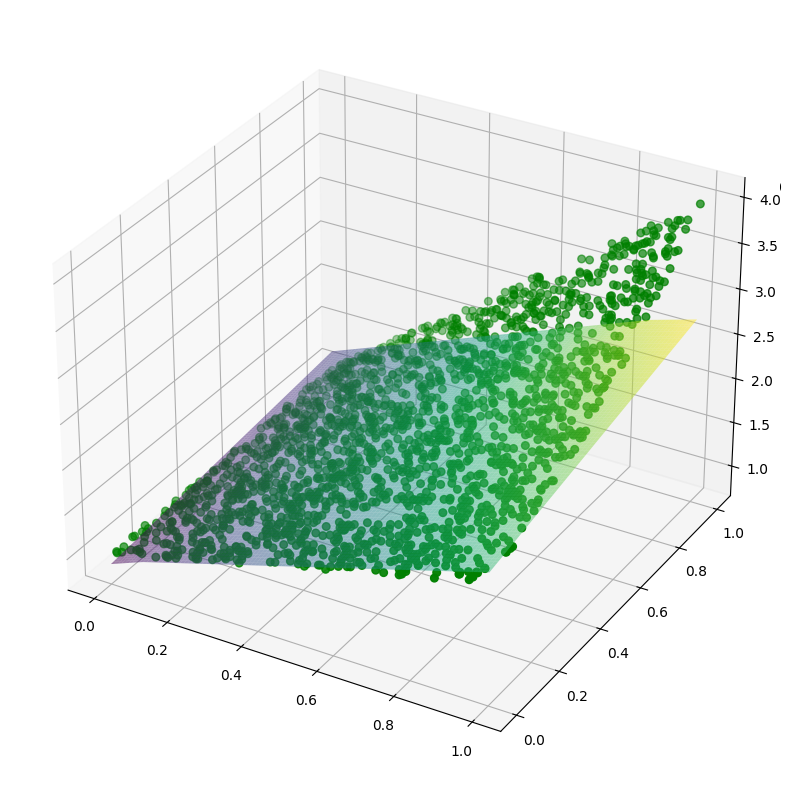

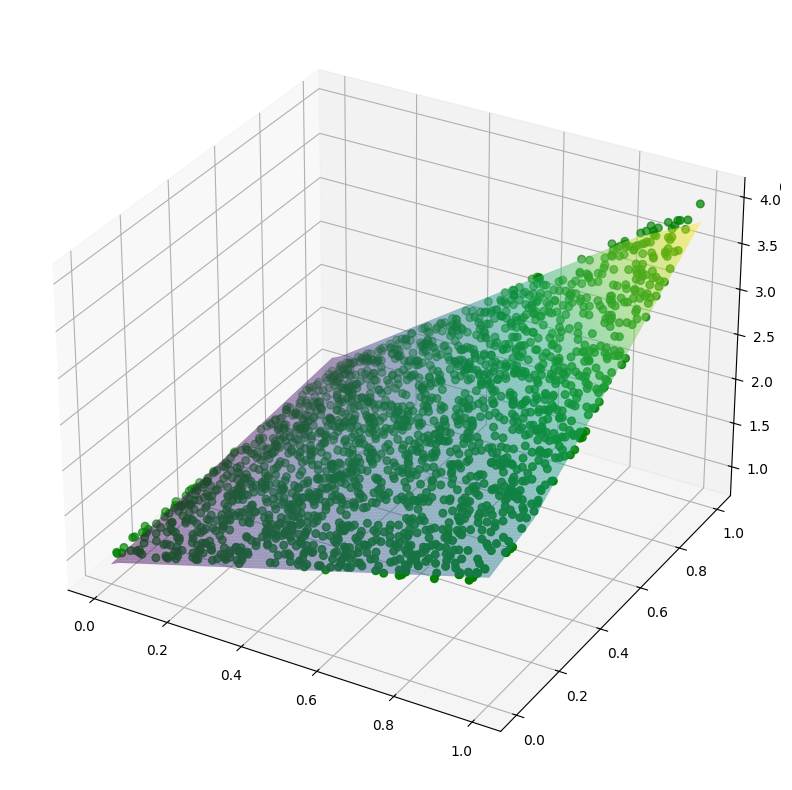

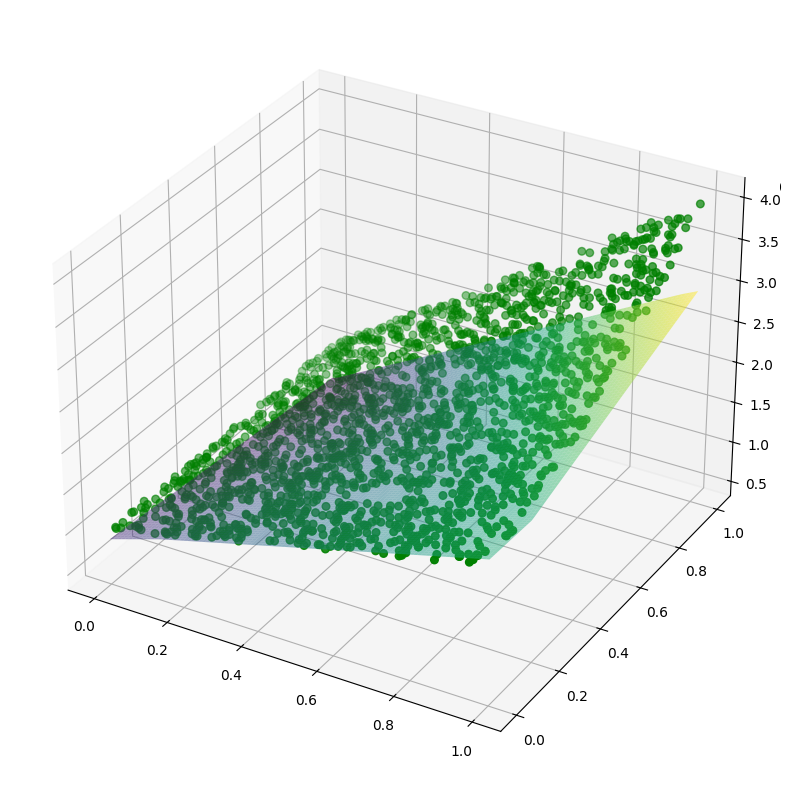

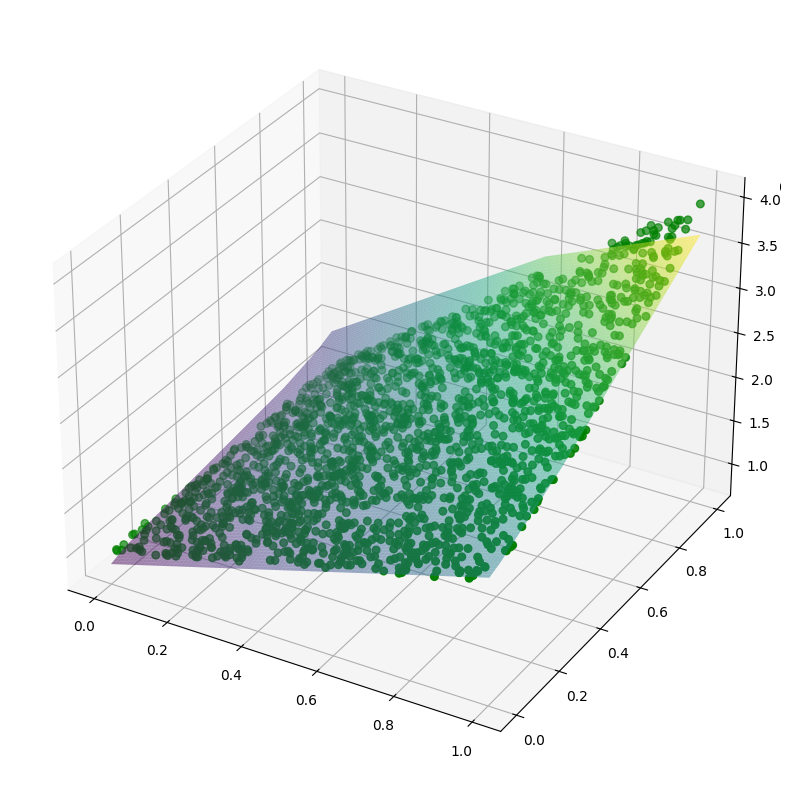

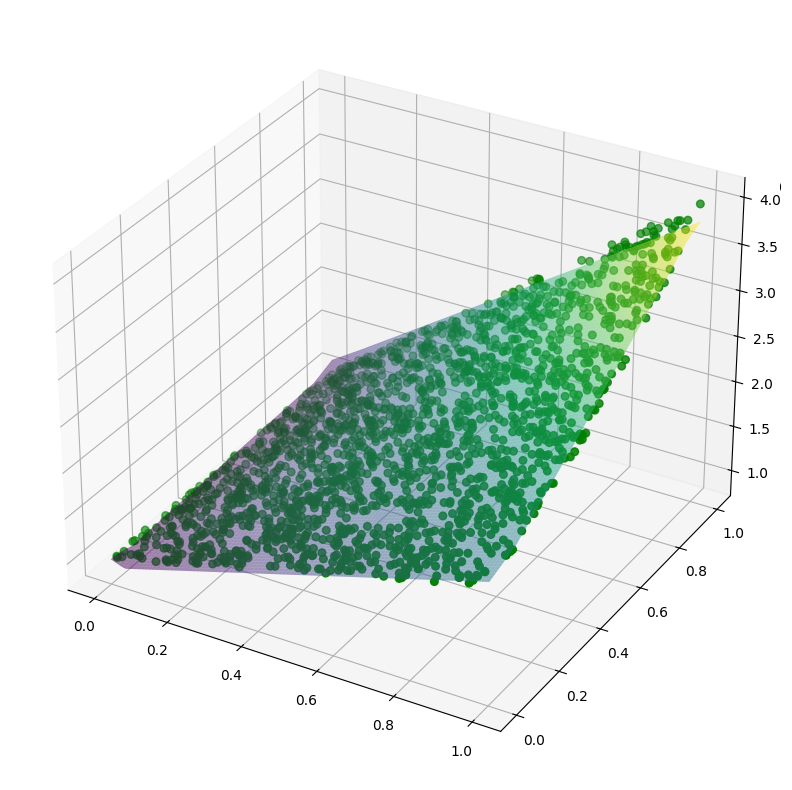

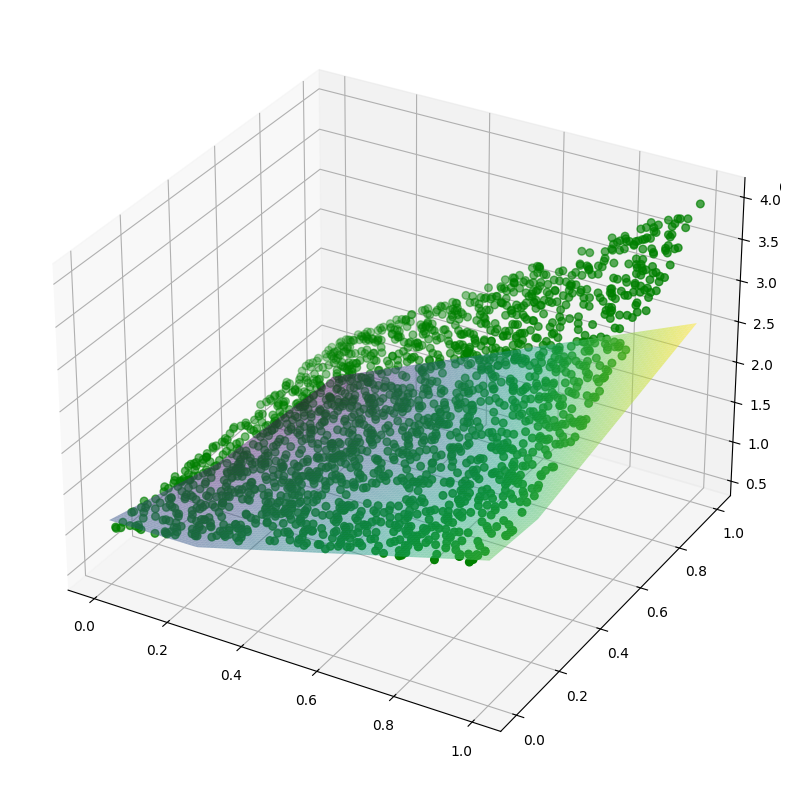

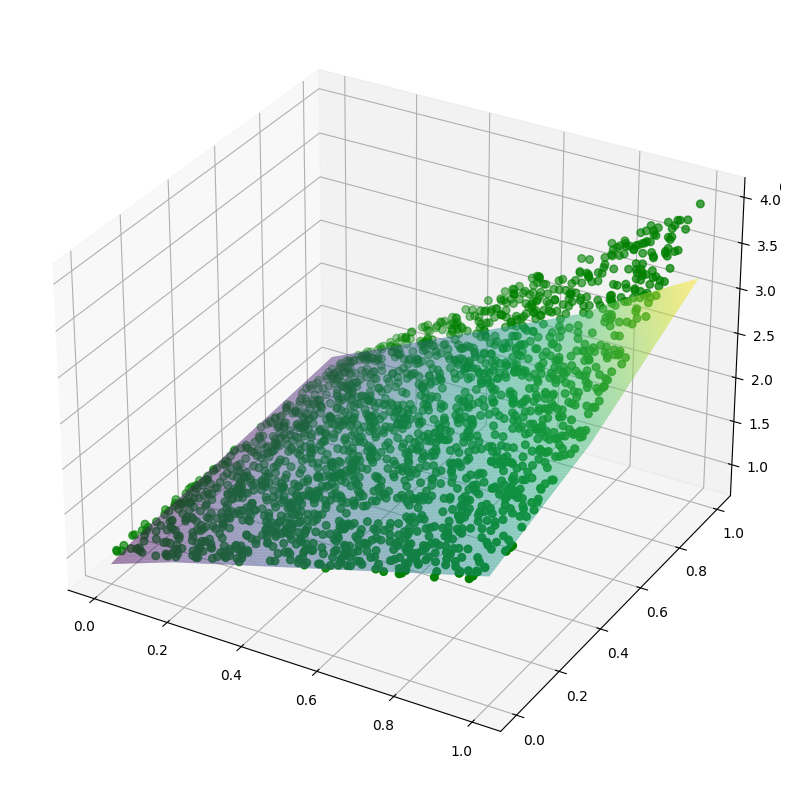

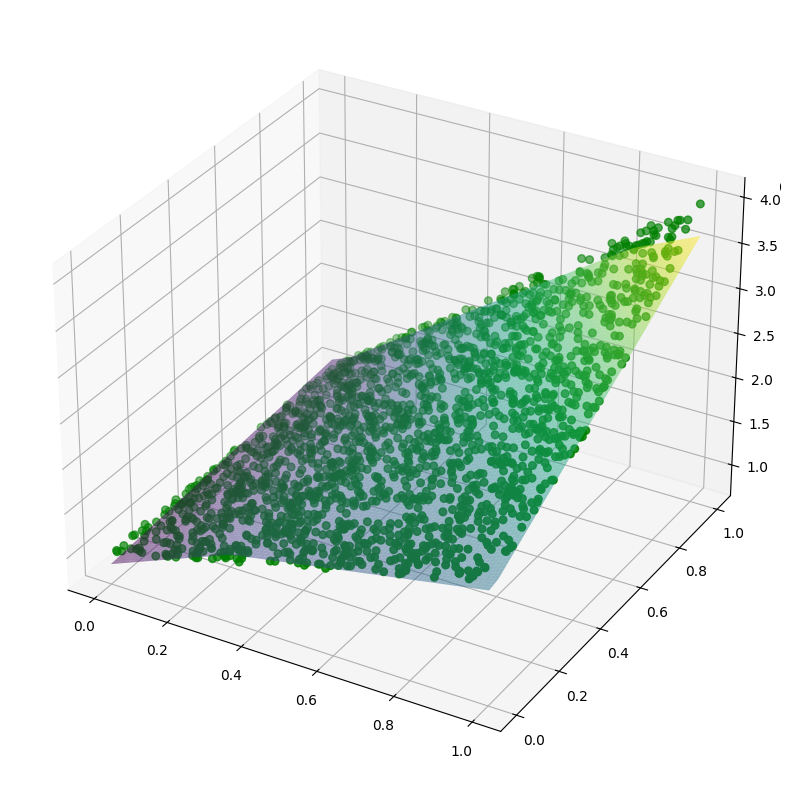

In [18]:
import numpy as np
import random
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
nSuccess = 0
##import dataset
dataset = np.load("/content/drive/MyDrive/EE8204/approximatemeifyoucan.npy")
#note for datset its x1, x2, t
x = np.zeros((4000, 2))
x_train = np.zeros((4000, 2))
t = np.zeros((4000, 1))
x[:,0] = dataset[0,:]
x[:,1] = dataset[1,:]
t = dataset[2,:]
##using a 2/4-1 RELU activating function


for zd in range(50):
  nTrain = 2000
  nEpoch = 6 # number of training points
  nTest = 2000 # number of test points
  alpha = 0.03 # step size (learning rate)
  w11f = np.zeros(nEpoch * nTrain)
  w12f = np.zeros(nEpoch * nTrain)


  #################### Parameter Initialization #########################
  w11 = 0.5 - np.random.rand()
  w12 = 0.5 - np.random.rand()
  w21 = 0.5 - np.random.rand()
  w22 = 0.5 - np.random.rand()
  w31 = 0.5 - np.random.rand()
  w32 = 0.5 - np.random.rand()
  w41 = 0.5 - np.random.rand()
  w42 = 0.5 - np.random.rand()
  w51 = 0.5 - np.random.rand()
  w52 = 0.5 - np.random.rand()
  w61 = 0.5 - np.random.rand()
  w62 = 0.5 - np.random.rand()

  b2 = 0.5 - np.random.rand()
  b1 = 0.5 - np.random.rand()
  b3 = 0.5 - np.random.rand()
  b4 = 0.5 - np.random.rand()
  b5 = 0.5 - np.random.rand()
  b6 = 0.5 - np.random.rand()

  ww1 = 0.5 - np.random.rand()
  ww2 = 0.5 - np.random.rand()
  ww3 = 0.5 - np.random.rand()
  ww4 = 0.5 - np.random.rand()
  ww5 = 0.5 - np.random.rand()
  ww6 = 0.5 - np.random.rand()


  bb = 0.5 - np.random.rand()

  sp = np.arange(0, nTrain + nTest) # indexes for random selection of data for training and testing


  x_min = np.min(x[:nTrain, :], axis=0)
  x_max = np.max(x[:nTrain, :], axis=0)
  ########################### Training #################################
  p = 0
  for epoch in range(0, nEpoch):
      for i in range(0, nTrain):
          y1 = b1 + w11 * x[sp[i], 0] + w12 * x[sp[i], 1]
          y2 = b2 + w21 * x[sp[i], 0] + w22 * x[sp[i], 1]
          y3 = b3 + w31 * x[sp[i], 0] + w32 * x[sp[i], 1]
          y4 = b4 + w41 * x[sp[i], 0] + w42 * x[sp[i], 1]
          y5 = b5 + w51 * x[sp[i], 0] + w52 * x[sp[i], 1]
          y6 = b6 + w61 * x[sp[i], 0] + w62 * x[sp[i], 1]
          dxx1 = y1 > 0
          xx1 = y1 * dxx1
          dxx2 = y2 > 0
          xx2 = y2 * dxx2 # rect. activation
          dxx3 = y3 > 0
          xx3 = y3 * dxx3
          dxx4 = y4 > 0
          xx4 = y4 * dxx4 # rect. activation
          dxx5 = y5 > 0
          xx5 = y5 * dxx5 # rect. activation
          dxx6 = y6 > 0
          xx6 = y6 * dxx6 # rect. activation
          yy = bb + ww1 * xx1 + ww2 * xx2
          yy = yy + ww3 * xx3 + ww4 * xx4
          yy = yy + ww5 * xx5 + ww6 * xx6
          e = t[sp[i]] - yy
          ww1 = ww1 + alpha * e * xx1
          ww2 = ww2 + alpha * e * xx2
          ww3 = ww3 + alpha * e * xx3
          ww4 = ww4 + alpha * e * xx4
          ww5 = ww5 + alpha * e * xx5
          ww6 = ww6 + alpha * e * xx6
          bb = bb + alpha * e
          w11 = w11 + alpha * e * ww1 * dxx1 * x[sp[i], 0]
          w12 = w12 + alpha * e * ww1 * dxx1 * x[sp[i], 1]
          w21 = w21 + alpha * e * ww2 * dxx2 * x[sp[i], 0]
          w22 = w22 + alpha * e * ww2 * dxx2 * x[sp[i], 1]
          w31 = w31 + alpha * e * ww3 * dxx3 * x[sp[i], 0]
          w32 = w32 + alpha * e * ww3 * dxx3 * x[sp[i], 1]
          w41 = w41 + alpha * e * ww4 * dxx4 * x[sp[i], 0]
          w42 = w42 + alpha * e * ww4 * dxx4 * x[sp[i], 1]
          w51 = w51 + alpha * e * ww5 * dxx5 * x[sp[i], 0]
          w52 = w52 + alpha * e * ww5 * dxx5 * x[sp[i], 1]
          w61 = w61 + alpha * e * ww6 * dxx6 * x[sp[i], 0]
          w62 = w62 + alpha * e * ww6 * dxx6 * x[sp[i], 1]

          b1 = b1 + alpha * e * ww1 * dxx1
          b2 = b2 + alpha * e * ww2 * dxx2
          b3 = b3 + alpha * e * ww3 * dxx3
          b4 = b4 + alpha * e * ww4 * dxx4
          b5 = b5 + alpha * e * ww5 * dxx5
          b6 = b5 + alpha * e * ww5 * dxx5
          w11f[p] = w11
          w12f[p] = w12
          p = p + 1

  ######################## Testing ######################################
  err = 0
  for i in range(nTrain, nTrain + nTest):
      y1 = b1 + w11 * x[sp[i], 0] + w12 * x[sp[i], 1]
      y2 = b2 + w21 * x[sp[i], 0] + w22 * x[sp[i], 1]
      y3 = b3 + w31 * x[sp[i], 0] + w32 * x[sp[i], 1]
      y4 = b4 + w41 * x[sp[i], 0] + w42 * x[sp[i], 1]
      y5 = b5 + w51 * x[sp[i], 0] + w52 * x[sp[i], 1]
      y6 = b6 + w61 * x[sp[i], 0] + w62 * x[sp[i], 1]
      dxx1 = y1 > 0
      xx1 = y1 * dxx1
      dxx2 = y2 > 0
      xx2 = y2 * dxx2 # rect. activation
      dxx3 = y3 > 0
      xx3 = y3 * dxx3
      dxx4 = y4 > 0
      xx4 = y4 * dxx4 # rect. activation
      dxx5 = y5 > 0
      xx5 = y5 * dxx5 # rect. activation
      dxx6 = y6 > 0
      xx6 = y6 * dxx6 # rect. activation
      yy = bb + ww1 * xx1 + ww2 * xx2
      yy = yy + ww3 * xx3 + ww4 * xx4
      yy = yy + ww5 * xx5 + ww6 * xx6
      e = abs(t[sp[i]] - yy)
      err = err + e
  err = err / nTest
  if err < 0.05:
    nSuccess += 1
    ##plotting proximating surface
    plt.figure(figsize=(10, 10))
    ax = plt.axes(projection='3d')
    X = np.linspace(np.min(x[:, 0]), np.max(x[:, 0]), 100)
    Y = np.linspace(np.min(x[:, 1]), np.max(x[:, 1]), 100)
    X,Y = np.meshgrid(X,Y)
    y1 = b1 + w11 * X + w12 * Y
    y2 = b2 + w21 * X + w12 * Y
    y3 = b3 + w31 * X + w32 * Y
    y4 = b4 + w41 * X + w42 * Y
    y5 = b5 + w51 * X + w52 * Y
    y6 = b6 + w61 * X + w62 * Y
    dxx1 = y1 > 0
    xx1 = y1 * dxx1
    dxx2 = y2 > 0
    xx2 = y2 * dxx2 # rect. activation
    dxx3 = y3 > 0
    xx3 = y3 * dxx3
    dxx3 = y3 > 0
    xx4 = y3 * dxx3 # rect. activation
    xx4 = y4 * dxx4
    dxx4 = y4 > 0
    xx4 = y4 * dxx4 # rect. activation
    dxx5 = y5 > 0
    xx5 = y5 * dxx5 # rect. activation
    dxx6 = y6 > 0
    xx6 = y6 * dxx6 # rect. activation
    yy = bb + ww1 * xx1 + ww2 * xx2
    yy = yy + ww3 * xx3 + ww4 * xx4
    yy = yy + ww5 * xx5 + ww6 * xx6
    Z = yy
    ax = plt.axes(projection='3d')
    ax.scatter(x[2000:4000, 0], x[2000:4000, 1], t[2000:4000],color='g', label = 'Data', s=30)
    ax.plot_surface(X, Y, Z, rstride=1, cstride=1, label = 'approximation', cmap='viridis', alpha=0.5)




In [ ]:
##prediction

dataset2 = np.load("/content/drive/MyDrive/EE8204/finaltest.npy")

x_final = np.zeros((2000, 2))
x_final[:,0] = dataset2[0,:]
x_final[:,1] = dataset2[1,:]
prediction = np.zeros((1, 2000))
pred = 2000

for i in range(0, pred):
      y1 = b1 + w11 * x_final[i, 0] + w12 * x_final[i, 1]
      y2 = b2 + w21 * x_final[i, 0] + w22 * x_final[i, 1]
      y3 = b3 + w31 * x_final[i, 0] + w32 * x_final[i, 1]
      y4 = b4 + w41 * x_final[i, 0] + w42 * x_final[i, 1]
      y5 = b5 + w51 * x_final[i, 0] + w52 * x_final[i, 1]
      y6 = b6 + w51 * x_final[i, 0] + w52 * x_final[i, 1]
      dxx1 = y1 > 0
      xx1 = y1 * dxx1
      dxx2 = y2 > 0
      xx2 = y2 * dxx2 # rect. activation
      dxx3 = y3 > 0
      xx3 = y3 * dxx3
      dxx4 = y4 > 0
      xx4 = y4 * dxx4 # rect. activation
      dxx5 = y5 > 0
      xx5 = y5 * dxx5 # rect. activation
      dxx6 = y6 > 0
      xx6 = y6 * dxx6 # rect. activation
      yy = bb + ww1 * xx1 + ww2 * xx2
      yy = yy + ww3 * xx3 + ww4 * xx4
      yy = yy + ww5 * xx5 + ww6 * xx6
      prediction[0, i] = yy
      np.transpose(prediction)

np.save("/content/drive/MyDrive/EE8204/prediction.npy", prediction)
#